# Age and Gender Recognition with Tensoflow 

#### This project uses Google's inception v3 model with Tensorflow to predict the age and the gender of a person in a portrait, after training the model using 20000 wikipedia.org portraits from the [IMDB-WIKI dataset](https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/). While an accuracy of 90.5% is achieved for gender (male/female) classification, the inception v3 model is unable to accurately predict age when trained on the wikipedia portraits database, with a Mean Absolute Error of 8.8 years. 

<p align="center"><img src="./images/predictions_examples.png" width = "1000"></p>


## Introduction


Determining the age and gender of a person using pictures or video can have numerous applications, including targeted recommendations in stores, adapting the contents of a video for younger audience, security control, etc. 

The purpose of this project is to estimate the gender and age of a person based on a portrait, using Google's [inception v3 model](https://www.tensorflow.org/tutorials/images/image_recognition) with Tensorflow. The inception v3 model is a deep convolutional neural network designed for computer vision classification, specifically trained to classify pictures of objects in the [ImageNet database](https://en.wikipedia.org/wiki/ImageNet). This model is then re-trained on about 20000 images of faces obtained from [wikipedia.org](https://en.wikipedia.org/wiki/Main_Page), with gender and age information available for each picture. 

Tensorflow offers a [tutorial](https://www.tensorflow.org/hub/tutorials/image_retraining) for retraining the inception v3 model using new categories provided by the user. In particular, the [retrain.py](https://github.com/tensorflow/hub/blob/master/examples/image_retraining/retrain.py) file provided for this tutorial is used in this project for creating bottlenecks for each picture (i.e. the 2048 outputs of the second-to-last layer of the convolutional neural network, which is essentially a method for converting a picture into 2048 useful features for classifying images) and for retraining the model for gender classification and age regression.


## Description and main results

### Data preparation

The pictures and metadata were downloaded from this [link](https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/static/wiki_crop.tar).

The data is first cleaned by converting the date of birth from Matlab serial date number to pandas datetime. This allows the calculation of the age of the person in the picture by calculating the difference between the date when the picture was taken (obtained from image file metadata) and their date of birth.

Then, a random sample of 20000 images (10000 males and 10000 females) from this dataset is selected and the images are moved to a folder based on their gender (male & female folders) to allow the inception v3 re-training process by Tensorflow.

Because this sample of 20000 images was not perfectly clean (some portraits gender are mislabelled, mainly because of the face extraction algorithm to generate the portraits from Wikipedia pictures), it became necessary to remove the images with mislabelled gender manually. Since this is obviously a very time-consuming and tedious task (about 2 or 3 hours spent scanning rows of images to spot mislabeled gender), the cleaned dataset containing 19213 images is provided in this repository.

### Gender predictions

#### Gender predictions using Tensorflow

Then, using Tensorflow's retrain module, the gender of each person in the selected portrait database is predicted using cross-validation. For each validation fold, the remaining images are moved to a training folder and the inception v3 model is retrained on the specified labels for these training images. Then, for each image in the validation fold, the gender is predicted. Finally, the training data is moved back to the original folder. Because the most time-consuming part of this process is the generation of bottlenecks files by the inception v3 model for each image, they are also included in the repository. 

The cross-validated accuracy obtained by the re-trained model for predicting the gender in the portraits is 89.2%.

By looking at the mislabelled images in the figure below, it can be clearly seen that males with long hair are often mislabelled as females by the model, even when they possess some masculine facial features (strong jaw, facial hair, etc.). 

<p align="center"><img src="./images/mislabelled_gender.png" width = "1000"></p>

On the contrary, women with long blond hair are often successfully labelled with a confidence level close to 100%, as shown in the figure below.

<p align="center"><img src="./images/most_confident_predictions_gender.png" width = "1000"></p>

In fact, if the average faces of a male and of a female are calculated and plotted (see figure below), it can be clearly seen that, despite the blur caused by averaging thousands of unaligned pictures, the typical male in the dataset has short hair while the typical female has long hair.

<p align="center"><img src="./images/average_female_male.png" width = "700"></p>

When plotting the renormalized difference between the average face of a female and that of a male, it is possible to identify the main difference between typical females and males in the dataset: females have darker spots along the side due to their typically long hair, their chin is lighter because they lack facial hair, their lips are redder (possibly due to the use of lipstick) and their eyes are darker (also possibly because of makeup). Incidentally, their clothes are slightly redder than that of males, which is probably not a very relevant criterion for classifying the gender of a person.

<p align="center"><img src="./images/diff_female_male.png" width = "350"></p>

The figure below shows the confusion matrix for cross-validated gender predictions. Most errors correspond to females labelled as men by the model, and indeed, it can be observed that the average mislabelled female portrait looks very similar to the average correctly labelled male portrait, including the shorter hair and the average color of clothes.

<p align="center"><img src="./images/confusion_matrix_gender.png" width = "580"></p>

All these observations show that the re-trained model bases its decisions mainly on spatial features and is probably unable to detect and analyse each facial feature independently (e.g. shape and size of jaw relative to the face, structure of the skin, etc...) as humans usually do. Indeed, a human can identify the gender for each image in this database with an accuracy close to 100%.

#### Gender predictions with Gradient Boosting classifier

By using the bottlenecks created by the inception v3 model for each picture as features, it is also possible to use another model to predict gender. In this project, the [light Gradient Boosting Machine (lightGBM)](https://lightgbm.readthedocs.io/en/latest/) classifier model (a [Gradient Boosting](https://en.wikipedia.org/wiki/Gradient_boosting) algorithm) is used, instead of inception's model last Softmax activation layer. LightGBM is known for both speed and accuracy performance for such structured problems (once the bottlenecks features are created, this project becomes a typical machine learning task). 

Indeed, the cross-validated predictions for gender with Tensorflow take about 48 hours of computation time on a laptop with reasonably good performances, or 24 hours if the bottlenecks files already exist (in which case most of the time is spent on image processing for predictions because the bottlenecks are already available for training the model). Instead, the LightGBM model is able to make cross-validated predictions in a few minutes because all the relevant information required for training and predictions is already contained in the bottlenecks files.

After optimizing the lightGBM model's [hyperparameters](https://en.wikipedia.org/wiki/Hyperparameter_(machine_learning)) (number of trees, depth of trees, minimum number of images per leaf, L1 and L2 regularization, etc.) using a self-made GridSearch function, the cross-validation accuracy for predicting gender is increased to 90.5% (instead of 89.2% for the inception model alone). The probability distributions for gender predictions are very skewed toward the correct label, as shown in the figure below. 

<p align="center"><img src="./images/Probability_gender_LGBM.png" width = "580"></p>

The graph below shows that the corresponding area under the [receiver operating characteristic curve](https://en.wikipedia.org/wiki/Receiver_operating_characteristic) (ROC AUC) is equal to 0.967 for the cross-validated data and 0.993 for the training data. This large difference indicates that the model is [overfitting the training data](https://en.wikipedia.org/wiki/Overfitting) (i.e. it "memorizes" the training data thanks to the large number of free parameters in the model), but its accuracy is nevertheless optimized for unseen validation data.

<p align="center"><img src="./images/ROC_AUC_gender_LGBM.png" width = "600"></p>


### Age predictions

Using the same bottlenecks as the ones generated by the retrain module for the gender labels (bottlenecks created by the inception model are independent of the training labels), it is also possible to train a lightGBM regressor model to predict the age of the person in each image.

Once optimized using a GridSearch function, the lightGBM regressor model was able to predict the age in the portraits with a [Mean Absolute Error](https://en.wikipedia.org/wiki/Mean_absolute_error) (MAE) of 8.8 years, and a [Root-Mean-Square Error](https://en.wikipedia.org/wiki/Root-mean-square_deviation) (RMSE) of 11.5 years. The figure below shows the predicted age from the pictures as a function of actual age for training and cross-validation data.

<p align="center"><img src="./images/predicted_age_vs_age.png" width = "600"></p>

By comparison, [the best models](https://pdfs.semanticscholar.org/c570/2b45686cc4eb357627bbc8bb05e8c7281e8d.pdf) for predicting the age using face images lead to a MAE of around 3 years. This relatively poor performance by the inception v3 model may be explained by the fact that it has been optimized and pre-trained to classify thousands of item categories and was not designed for this age estimation regression task. Moreover, more successful models usually rely on a much larger dataset. While using the entire IMDB-WIKI database (500000 images) would improve predictions, the data was limited to 20000 images in this project to limit training time.

Nevertheless, this model does perform significantly better than a random guess, as can be demonstrated by shuffling the target data (i.e. age) in the dataset. In this case, while the model is able to overfit the training images to the randomized age (Pearson's correlation coefficient: 0.93), this correlation disappears for the validation data (Pearson's correlation coefficient: 0.0), as shown in the figure below. The associated MAE and RMSE are 13.5 years and 16.7 years, respectively.

<p align="center"><img src="./images/predicted_age_vs_age_random.png" width = "600"></p>

In the picture below are shown the average portraits for different age groups, as predicted by the model. Despite the fact that these averaged pictures are blurry, some of the main features of aging can be observed, including grey hair and receding hairline. Once again, the color of the clothes appears to be a significant factor for predicting the age (older people tend to have darker clothes), which may explain some of the errors made by the model.

<p align="center"><img src="./images/average_portrait_vs_age.png" width = "800"></p>

Unlike gender, the database cannot be cleaned manually in a reasonable amount of time (since age is continuous and much harder to estimate than gender for humans). However, some of the worst absolute errors made by the model are caused by mislabelled age in the training data as seen in the figure below.

<p align="center"><img src="./images/mislabelled_age.png" width = "1000"></p>

### Conclusions

Using the bottleneck features created by the inception v3 model, the gradient boosting model (lightGMB) is able to predict the gender of a person in an image with a 90.5% accuracy. This model is however unable to accurately predict the age of the person, with a mean absolute error of 8.8 years.

## How to use

Start by cloning this repository and opening [this notebook](./Age and Gender Recognition.ipynb) wih jupyter. The pictures and metadata must then be downloaded from this [link](https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/static/wiki_crop.tar), and extracted to the ./data directory.

To save some time (24 to 48 hours), it is recommended to skip the Tensorflow model training and to read the wiki_metadata.csv file directly. This repository already includes the verified gender images (about 19000 pictures) and the tensorflow bottlenecks for these images to save time and effort.

In addition to the main data science Python libraries (numpy, pandas, seaborn, sklearn, etc...), this notebook requires the installation of the following modules:
 - Tensorflow: v1.8.0
 - Tensorflow_hub: v0.1.1
 - PIL: v4.2.1
 - lightgbm: v2.1.2
 
Once Tensorflow is installed, it is necessary to replace "_sys.exit(main(argv))" by "main(argv)" in app.py (/Anaconda3/Lib/site-packages/tensorflow/python/platform/app.py) to avoid a SystemError (as sys.exit function attempts to close python which is prevented by jupyter notebook).

## Credits

- IMDB-WIKI portraits dataset: https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/

- Tensorflow: How to Retrain an Image Classifier for New Categories: https://www.tensorflow.org/hub/tutorials/image_retraining

In [1]:
# Importing main modules
import pandas as pd
import numpy as np
import scipy
import scipy.io
from datetime import datetime, timedelta
import shutil
import os
import os.path
import time
import sys
import argparse

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import PIL
from PIL import ImageEnhance

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error
from sklearn.metrics import confusion_matrix, roc_curve, auc
from lightgbm import LGBMRegressor, LGBMClassifier

# Importing Tensorflow modules
import tensorflow as tf
import tensorflow_hub as hub

# Importing functions from retrain.py and label_image.py
import retrain
import label_image

C:\Anaconda3\lib\site-packages\h5py\__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
## Change graphics ##

# Setting Seaborn default style 
sns.set(font_scale=1.4)
sns.set_style("white")

# Reverting to old color palette
pal = sns.color_palette("deep")
pal = pal.as_hex()
pal[1], pal[2], pal[3] = pal[2], pal[3], pal[1]
sns.set_palette(pal)

In [3]:
## Parameters ##

# Bins for gender recognition
gender_bins = ["male", "female"]

# Minimum and maximum age for age recognition (to remove absurd values such as centuries old portraits)
min_age = 0
max_age = 100

# Definition of columns for metadata files
columns_wiki = ["dob", "year_photo_taken", "full_path", "gender", "name", "face_location", "face_score", "second_face_score"]

# Default Flag values for retrain.py
FLAGS = argparse.Namespace()
FLAGS.image_dir = ""
FLAGS.output_graph = './retrained_graph.pb'
FLAGS.output_labels = './output_labels.txt'
FLAGS.summaries_dir = './summaries/'
FLAGS.how_many_training_steps = 4000
FLAGS.learning_rate = 0.01
FLAGS.testing_percentage = 20
FLAGS.validation_percentage = 20
FLAGS.eval_step_interval = 10
FLAGS.train_batch_size = 100
FLAGS.test_batch_size = -1
FLAGS.validation_batch_size = 100
FLAGS.print_misclassified_test_images = True
FLAGS.model_dir = "."
FLAGS.bottleneck_dir = "bottlenecks"
FLAGS.final_tensor_name = "final_result"
FLAGS.flip_left_right = False
FLAGS.random_crop = 0
FLAGS.random_scale = 0
FLAGS.random_brightness = 0
FLAGS.intermediate_store_frequency = 0
FLAGS.tfhub_module = "https://tfhub.dev/google/imagenet/inception_v3/feature_vector/1"
FLAGS.saved_model_dir = ""

In [4]:
## Functions ##

# This function converts metadata Matlab files to pandas dataframe
def convert_mat_dataframe(mat_file, columns, dict_key):
    mat = scipy.io.loadmat(mat_file)
    mat_data = mat[dict_key][0][0]
    df = pd.DataFrame()
    for index, item in enumerate(mat_data):
        if len(item[0]) == len(mat_data[0][0]): # Columns are only added to the dataframe if all the data is available
            df[columns[index]] = item[0]
    return(df)


# This function converts the Matlab serial date number to pandas datetime
def convert_date(Matlab_date):
    try:
        python_dt = datetime.fromordinal(int(Matlab_date)) + timedelta(days=Matlab_date%1) - timedelta(days = 366)
    except OverflowError:
        python_dt = None
    return python_dt


# This function converts the numpy arrays in the metadata Matlab files to its first element
def select_first_element(array):
    if len(array) > 0:
        return array[0]
    else:
        return np.NaN

    
# This function calculates the age of the person the year the photo was taken
def calculate_age(df):
    age_list = []
    counter = 0
    for index, row in df.iterrows():
        counter += 1
        progress(counter, len(df))
        # Since data of photo is not known precisely, it is assumed to be July 1st
        date_photo = datetime(year = row["year_photo_taken"], month = 7, day = 1)
        date_of_birth = row["dob_py"]
        if date_of_birth.month < date_photo.month:
            age = int(date_photo.year - date_of_birth.year)
        else:
            age = int(date_photo.year - date_of_birth.year - 1)
        age_list.append(age)
    return age_list


# This function clarifies the gender in the daraframe (1.0 is replaced by "male" and 0.0 is replaced by "female")
def clarify_gender(gender):
    if gender == 1.0:
        gender = "male"
    else:
        gender = "female"
    return gender


# This function display the progress percentage of the current task
def progress(index, lenght):
    progress = index/lenght*100
    if progress != 100:
        sys.stdout.write("Progress: %d%%   \r" % (progress) )
        sys.stdout.flush()
    else:
        sys.stdout.write("Progress: %d%%   \n" % (progress) )

        
# This function creates a sample of images in folders organized by gender to allow training with Tensorflow 
def create_verified_gender_training_folder(df, origin = "./data/wiki/", folder = "./data/verified_gender/", nb_samples = 10000):
    counter = 0
    # Creating verified data folders
    if not os.path.exists(folder):
        os.mkdir(folder)
    for gender in gender_bins:
        if not os.path.exists(folder+str(gender)):
            os.mkdir(folder+str(gender))
        
        if nb_samples > len(df[df["gender"] == gender]):
            nb_samples = len(df[df["gender"] == gender])
            
        # Selecting random sample of images for each gender and copying them to verified data folders
        df_gender = df[df["gender"] == gender].sample(n=nb_samples, random_state = 1)
        counter_gender = 0
        for index, row in df_gender.iterrows():
            counter = counter + 1
            progress(counter, len(gender_bins) * nb_samples)
            old_path = origin+row["full_path"]
            new_file_name = str(row.name)+"_"+row["name"]+"_"+row["gender"]+"_"+str(row["age"])+".jpg"
            new_path = folder+str(gender)+"/"+new_file_name
            try:
                shutil.copy(old_path, new_path)
                counter_gender += 1
            except:
                print("File missing :", old_path)
        print(str(counter_gender) + " " + gender + " images moved to training folder")


# This function defines a more explicit file name for the image file
def define_new_file_name(row):
    return str(row.name)+"_"+row["name"]+"_"+row["gender"]+"_"+str(row["age"])+".jpg"


# This function defines the new training folder for the image depending on the selected feature
def define_new_path(row, path, feature):
    return path+row[feature]+"/"+str(row.name)+"_"+row["name"]+"_"+row["gender"]+"_"+str(row["age"])+".jpg"


# This function verifies if the picture is in the verified_data folder
def is_verified(row, folder, feature):
    if os.path.exists(row["new_path_gender"]):
        return 1
    else:
        return 0


# This function (adapted from the Tensorflow label_image.py) returns the probabilities that the dataset labels 
# are correct based on the corresponding image using cross-validation on the training data
def cv_classify_images(df, feature, feature_bins, 
                       path_data, path_training = "./data/tmp/", 
                       model_folder = "./model/", model_name = "model",
                       info_level = 0, input_height = 299, input_width = 299, cv = 5):
    
    # Creating new features in dataframe
    label_file = model_folder+"output_labels.txt"
    labels = label_image.load_labels(label_file)
    for label in labels:
        df["probability_"+feature+"_"+label] = np.NaN
    df["correct_"+feature+"_probability"] = np.NaN
    
    # Creating temporary training directory
    if not os.path.exists(path_training):
        os.mkdir(path_training)
    for gender in gender_bins:
        if not os.path.exists(path_training+str(gender)):
            os.mkdir(path_training+str(gender))
    
    # Iteration on Cross-Validation folds
    kfold = KFold(n_splits=cv, shuffle=True, random_state = 42)
    counter_CV = 0
    for train_index, val_index in kfold.split(df):
        counter_CV += 1
        print("CV iteration:", counter_CV)

        # Definition of training and validation sets for the current fold
        train_df = df.iloc[train_index].copy()
        val_df = df.iloc[val_index].copy()
        
        # Moving each file into temporary folder for training
        print("Moving images into training folder")
        counter_move_file = 0
        for index, row in train_df.iterrows():
            counter_move_file += 1
            progress(counter_move_file, len(train_df))
            file_name = path_data+row[feature]+"/"+row["new_file_name"]
            new_path = path_training+row[feature]+"/"+row["new_file_name"]
            try:
                shutil.move(file_name, new_path)
            except:
                print("File missing :", file_name)
        print("Moving images into training folder : done")


        print("Retraining classifier")        
        FLAGS.how_many_training_steps = 500
        FLAGS.model_dir = model_folder
        FLAGS.output_graph = model_folder+"retrained_graph.pb"  
        FLAGS.output_labels = model_folder+"output_labels.txt"
        # No summaries are created because they cannot be removed until jupyter kernel is killed
        FLAGS.summaries_dir = ""
        FLAGS.final_tensor_name = model_name
        FLAGS.image_dir = path_training
        retrain.FLAGS = FLAGS
        
        # Setting verbosity level
        tf.logging.INFO = info_level
        
        # Training new model using training images
        tf.app.run(main=retrain.main)
        print("Retraining classifier : done")

        
        print("Classifying validation images")
        model_file = model_folder+"retrained_graph.pb"
        input_mean = 0
        input_std = 255
        input_layer = "Placeholder"
        output_layer = model_name
        graph = label_image.load_graph(model_folder+"retrained_graph.pb")
        input_name = "import/" + input_layer
        output_name = "import/" + output_layer
        
        counter_val = 0
        results_list = []
        prob_correct_label_list = []
        for index, row in val_df.iterrows():
            counter_val += 1
            progress(counter_val, len(val_df))

            file_name = path_data+row[feature]+"/"+row["new_file_name"]
            
            # Reading, resizing and processing image
            t = label_image.read_tensor_from_image_file(
                file_name,
                input_height=input_height,
                input_width=input_width,
                input_mean=input_mean,
                input_std=input_std)
        
            input_operation = graph.get_operation_by_name(input_name)
            output_operation = graph.get_operation_by_name(output_name)
        
            # Predicting label corresponding to image
            with tf.Session(graph=graph) as sess:
                results = sess.run(output_operation.outputs[0], {
                    input_operation.outputs[0]: t
                })
            results = np.squeeze(results)
            results_list.append(results)
            prob_correct_label = results[labels.index(row[feature])]
            prob_correct_label_list.append(prob_correct_label)

        df["correct_"+feature+"_probability"].iloc[val_index] = prob_correct_label_list

        for index, label in enumerate(labels):
            df["probability_"+feature+"_"+label].iloc[val_index] = np.asarray(results_list)[:,index]
            
        print("Classifying validation images : done")

        
        print("Moving back training images")
        for index, row in train_df.iterrows():
            file_name = "./data/verified_gender/"+row["gender"]+"/"+row["new_file_name"]
            new_path = "./data/tmp/"+row["gender"]+"/"+row["new_file_name"]
            try:
                shutil.move(new_path, file_name)
            except:
                print("File missing :", new_path)
        print("Moving back training images : done")
        print("")

    return df


# This function displays the images with the worst classification probability values
def display_worst_probability(df, feature, path_data, rows = 2, width = 299, height = 299, best = False):
    if best == False:
        df = df.sort_values(by = ["correct_"+feature+"_probability"])[0:rows*5]
        title = "Images with worst gender probability predictions"
    else:
        df = df.sort_values(by = ["correct_"+feature+"_probability"], ascending = False)[0:rows*5]
        title = "Images with best gender probability predictions"
    fig = plt.figure(figsize = (20,20*rows/5))
    plt.suptitle(title)
    axes = [fig.add_subplot(rows, 5, i + 1) for i in range(5*rows)]
    counter = 0
    for index, row in df.iterrows():
        ax = axes[counter]
        counter += 1
        im = PIL.Image.open(path_data+row[feature]+"/"+row["new_file_name"]).convert('RGBA')
        im = im.resize((width, height), PIL.Image.BILINEAR)
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis("off")
        ax.text(10, -35, row["name"], verticalalignment = "center", horizontalalignment = "left", color = "black", size = 13)
        if row["correct_"+feature+"_probability"] > 0.5:
            color_gender = pal.as_hex()[1]
            predicted_gender = row[feature]
            prediction_prob = row["correct_"+feature+"_probability"]
        else:
            color_gender = pal.as_hex()[2]
            prediction_prob = 1 - row["correct_"+feature+"_probability"]
            if row[feature] == "female":
                predicted_gender = "male"
                
            else:
                predicted_gender = "female"
        ax.text(10, -15, "Predicted gender: "+ predicted_gender +" ("+str(round(prediction_prob*100,1))+"%)", verticalalignment = "center", horizontalalignment = "left", color = color_gender, size = 12)
    plt.subplots_adjust(wspace = 0.05, hspace = 0.2)
    plt.show()

    
# This function generates and displays the average image given a list of images, with renormalization of the RGB pixels
# so that the minimum is 0 and the maximum value is 255
def display_average_image(list_images, width = 299, height = 299):
    sum_images = np.zeros((width, height,3))
    counter = 0
    # Summing each pixel array (width*height*3 RGB colors)
    for image in list_images:
        im = PIL.Image.open(image)
        im = im.resize((width, height), PIL.Image.BILINEAR)
        im_array = np.asarray(im)
        # Keeping only RGB images (removes grey scale images)
        if im_array.shape == (width, height, 3):
            counter += 1
            sum_images += im_array 
    avg_images = sum_images / counter
    # Renormalization to ensure minimum value at 0 and maximum value at 255
    avg_images = (avg_images - np.min(avg_images))
    avg_images = avg_images/np.max(avg_images)*255
    avg_images = PIL.Image.fromarray(avg_images.astype('uint8'))
    sharpened = ImageEnhance.Sharpness(avg_images)
    sharpened = sharpened.enhance(1.0)
    sharpened = np.asarray(sharpened)

    # Display image
    plt.figure(figsize = (8,8))
    plt.imshow(sharpened)
    plt.xticks([])
    plt.yticks([])
    plt.show()

    
# This function generates and displays the difference between the average images of two lists of images,
# with the possibility to renormalize the difference to enhance the difference between pixels.
def display_difference_average_image(list_images1, list_images2, width = 299, height = 299, renormalize = False, title = None):
    sum_images = np.zeros((width, height,3))
    counter = 0
    # Summing each pixel array (width*height*3 RGB colors)
    for image in list_images1:
        im = PIL.Image.open(image)
        im = im.resize((width, height), PIL.Image.BILINEAR)
        im_array = np.asarray(im)
        # Keeping only RGB images (removes grey scale images)
        if im_array.shape == (width, height, 3):
            counter += 1
            sum_images += im_array 
    avg_images1 = sum_images / counter

    sum_images = np.zeros((width, height,3))
    counter = 0
    # Summing each pixel array (width*height*3 RGB colors)
    for image in list_images2:
        im = PIL.Image.open(image)
        im = im.resize((width, height),PIL.Image.BILINEAR)
        im_array = np.asarray(im)
        # Keeping only RGB images (removes grey scale images)
        if im_array.shape == (width, height, 3):
            counter += 1
            sum_images += im_array 
    avg_images2 = sum_images / counter
    
    #avg_diff = avg_images1 - avg_images2
    diff = (127 + (avg_images1 - avg_images2))/255

    # Renormalization to ensure minimum value at 0 and maximum value at 255
    if renormalize == True:
        diff = (diff - np.min(diff))
        diff = diff/np.max(diff)*255
        diff = PIL.Image.fromarray(diff.astype('uint8'))
        diff = ImageEnhance.Sharpness(diff)
        diff = diff.enhance(1.0)
        diff = np.asarray(diff)
    plt.figure(figsize = (8,8))
    if title != None:
        plt.suptitle(title, y = 0.95)
    plt.imshow(diff)
    plt.xticks([])
    plt.yticks([])
    plt.show()

    
# This function reads the bottlenecks files generated by Tensorflow for use in retraining with other models
def read_bottlenecks(df, path_bottlenecks, feature1 = "gender", feature2 = "age"):
    list_bottlenecks = []
    counter = 0
    labels = ["new_file_name"] + list(range(1,2049))
    bottlenecks = pd.DataFrame(columns  = labels)
    for index, row in df.iterrows():
        counter +=1
        progress(counter, len(df))
        file = path_bottlenecks+row[feature1]+"/"+row["new_file_name"]+"_https~tfhub.dev~google~imagenet~inception_v3~feature_vector~1.txt"
        file_bottlenecks = pd.read_csv(open(file, "r"), header = None, names  = range(1,2049))
        file_bottlenecks["new_file_name"] = row["new_file_name"]
        bottlenecks = bottlenecks.append(file_bottlenecks)
    return bottlenecks


# This function filters the dataframe to ensure that the range_age is evenly distributed (to avoid bias)
def stratify_age_data(df, ranges_age = [10, 20, 30, 40, 50, 60, 70, 100], sample_size = 1000):
    new_df = pd.DataFrame(columns = df.columns)
    df = df[(df["age"] >= ranges_age[0]) & (df["age"] < ranges_age[-1])]
    for index, age in enumerate(ranges_age[:-1]):
        df_age = df[(df["age"] > ranges_age[index]) & (df["age"] < ranges_age[index +1])]
        if len(df_age) > sample_size:
            df_age = df_age.sample(n = sample_size)
        new_df = new_df.append(df_age)
    return new_df


# Function for grid search for the LGBM classifier algorithm
def GridSearch_lgb_classifier(X, y, param_grid, cv = 5, predict = False):
    combinations= [[]]
    params = []
    for key, vals in param_grid.items():
        combinations = [i+[j] for i in combinations for j in vals]
        params.append(key)
    for comb in combinations:
        # Definition of parameters used for gridsearch iteration
        print("Hyperparameters:")
        for index, param in enumerate(params):
            print(param, ":", comb[index])
            estimator_param[param] = comb[index]
        
        # Cross validation
        kfold = KFold(n_splits=cv, shuffle=True, random_state = 2)
        roc_auc_val_list = []
        roc_auc_train_list = []
        accuracy_train_list = []
        accuracy_val_list = []
        fpr_train_list = []
        tpr_train_list = []
        fpr_val_list = []
        tpr_val_list = []
        best_ntree_list = []
        predictions_list = []
        counter = 0
        df_train = pd.DataFrame(index = X.index)
        df_val = pd.DataFrame(index = X.index)
        cv_predict = pd.DataFrame(index = X.index)
        cv_predict["predict_proba"] = np.NaN
        for train_index, val_index in kfold.split(X, y):
            counter += 1
            df_train[str(counter)] = np.NaN
            df_val[str(counter)] = np.NaN
            # Definition of training and validation sets for Kfold
            train_X = X.iloc[train_index]
            train_y = y.iloc[train_index]
            val_X = X.iloc[val_index]
            val_y = y.iloc[val_index]
            # Definition of model
            lgb = LGBMClassifier(boosting_type=estimator_param["boosting_type"],
                                 num_leaves=estimator_param["num_leaves"], 
                                 max_depth=estimator_param["max_depth"],
                                 learning_rate=estimator_param["learning_rate"],
                                 n_estimators=estimator_param["n_estimators"], 
                                 subsample_for_bin=estimator_param["subsample_for_bin"],
                                 objective=estimator_param["objective"],
                                 class_weight=estimator_param["class_weight"],
                                 min_split_gain=estimator_param["min_split_gain"],
                                 min_child_weight=estimator_param["min_child_weight"], 
                                 min_child_samples=estimator_param["min_child_samples"],
                                 subsample=estimator_param["subsample"],
                                 subsample_freq=estimator_param["subsample_freq"],
                                 bagging_freq = estimator_param["bagging_freq"],
                                 colsample_bytree=estimator_param["colsample_bytree"],
                                 reg_alpha=estimator_param["reg_alpha"],
                                 reg_lambda=estimator_param["reg_lambda"],
                                 random_state=estimator_param["random_state"],
                                 n_jobs=estimator_param["n_jobs"],
                                 silent=estimator_param["silent"], 
                                 importance_type=estimator_param["importance_type"],
                                )
            # Training the model on the training data with early stropping with the validation set
            lgb.fit(train_X, train_y, early_stopping_rounds=100, eval_set = [(val_X, val_y)], eval_metric="error", verbose =0)
            # Predictions on training and validation data for Kfold
            predictions_train = lgb.predict_proba(train_X, num_iteration = lgb.best_iteration_)
            predictions_val = lgb.predict_proba(val_X, num_iteration = lgb.best_iteration_)
            if predict == True:
                cv_predict["predict_proba"].iloc[val_index] = predictions_val[:,1]
            # Metrics
            fpr_train, tpr_train, threshold = roc_curve(train_y, predictions_train[:,1])
            fpr_val, tpr_val, threshold = roc_curve(val_y, predictions_val[:,1])
            roc_auc_train = auc(fpr_train, tpr_train)
            roc_auc_val = auc(fpr_val, tpr_val)
            accuracy_train  = accuracy_score(train_y, predictions_train[:,1].round())
            accuracy_val  = accuracy_score(val_y, predictions_val[:,1].round())
            print("CV %0.1i : Accuracy: %0.3f (n_trees: %0.1i)" % (counter, accuracy_val, lgb.best_iteration_))
            roc_auc_train_list.append(roc_auc_train)
            roc_auc_val_list.append(roc_auc_val)
            best_ntree_list.append(round(np.mean(lgb.best_iteration_)))
            fpr_train_list.append(fpr_train)
            tpr_train_list.append(tpr_train)
            fpr_val_list.append(fpr_val)
            tpr_val_list.append(tpr_val)
            accuracy_train_list.append(accuracy_train)
            accuracy_val_list.append(accuracy_val)

        avg_auc_train = np.mean(roc_auc_train_list)
        avg_auc_val = np.mean(roc_auc_val_list)
        std_auc_val = np.std(roc_auc_val_list)
        avg_accuracy_val = np.mean(accuracy_val_list)
        std_accuracy_val = np.std(accuracy_val_list)
        best_nb_iter = round(np.mean(best_ntree_list))
        print("Cross-Validation Accuracy: %0.4f +/- %0.4f (n_trees: %0.1i)" % (avg_accuracy_val, std_accuracy_val * 2, best_nb_iter))
                
        fig, ax = plt.subplots(figsize=(10,9))
        plt.title("Receiver operating characteristic for training and validation data with Gradient Boosting model", y = 1.03)
        for iteration in range(cv):
            if iteration == 0:
                ax.plot(fpr_train_list[iteration], tpr_train_list[iteration], label = 'Train data (AUC = %0.3f)' % avg_auc_train, color = pal.as_hex()[0])
                ax.plot(fpr_val_list[iteration], tpr_val_list[iteration], label = 'Validation data (AUC = %0.3f)' % avg_auc_val, color = pal.as_hex()[1])
            else:
                ax.plot(fpr_train_list[iteration], tpr_train_list[iteration] , color = pal.as_hex()[0])
                ax.plot(fpr_val_list[iteration], tpr_val_list[iteration], color = pal.as_hex()[1])
        ax.plot([0, 1], [0, 1], dashes = (6,4), color = pal.as_hex()[2], label = "Random decision (AUC = 0.500)")
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.xlim(0,1)
        plt.ylim(0,1)
        sns.despine()
        plt.legend(loc = 'lower right')
        plt.show()
        
        if predict == True:
            return cv_predict


def GridSearch_lgb_regressor(X, y, param_grid, cv, predict = False, early_stopping = True):
    combinations= [[]]
    params = []
    for key, vals in param_grid.items():
        combinations = [i+[j] for i in combinations for j in vals]
        params.append(key)
    for comb in combinations:
        # Definition of parameters used for gridsearch iteration
        print("Hyperparameters:")
        for index, param in enumerate(params):
            print(param, ":", comb[index])
            estimator_param[param] = comb[index]
        
        # Cross validation
        kfold = KFold(n_splits=cv, shuffle=True, random_state = 2)
        rmse_train_list = []
        rmse_val_list = []
        mae_train_list = []
        mae_val_list = []
        spearman_train_list = []
        spearman_val_list = []
        roc_auc_train_list = []
        accuracy_train_list = []
        accuracy_val_list = []
        fpr_train_list = []
        tpr_train_list = []
        fpr_val_list = []
        tpr_val_list = []
        best_ntree_list = []
        counter = 0
        df_train = pd.DataFrame(index = X.index)
        df_val = pd.DataFrame(index = X.index)
        cv_predict = pd.DataFrame(index = X.index)
        cv_predict["predict_proba"] = np.NaN
        for train_index, val_index in kfold.split(X, y):
            counter += 1
            df_train[str(counter)] = np.NaN
            df_val[str(counter)] = np.NaN
            # Definition of training and validation sets for Kfold
            train_X = X.iloc[train_index]
            train_y = y.iloc[train_index]
            val_X = X.iloc[val_index]
            val_y = y.iloc[val_index]
            # Definition of model
            lgb = LGBMRegressor(#boosting_type=estimator_param["boosting_type"],
                                # num_leaves=estimator_param["num_leaves"], 
                                max_depth=estimator_param["max_depth"],
                                learning_rate=estimator_param["learning_rate"],
                                n_estimators=estimator_param["n_estimators"], 
                                # subsample_for_bin=estimator_param["subsample_for_bin"],
                                objective=estimator_param["objective"],
                                # class_weight=estimator_param["class_weight"],
                                # min_split_gain=estimator_param["min_split_gain"],
                                # min_child_weight=estimator_param["min_child_weight"], 
                                min_child_samples=estimator_param["min_child_samples"],
                                subsample=estimator_param["subsample"],
                                subsample_freq=estimator_param["subsample_freq"],
                                # bagging_freq = estimator_param["bagging_freq"],
                                colsample_bytree=estimator_param["colsample_bytree"],
                                reg_alpha=estimator_param["reg_alpha"],
                                reg_lambda=estimator_param["reg_lambda"],
                                random_state=estimator_param["random_state"],
                                n_jobs=estimator_param["n_jobs"],
                                # silent=estimator_param["silent"], 
                                # importance_type=estimator_param["importance_type"],
                                )
            
            if early_stopping == True:
                lgb.fit(train_X, train_y, early_stopping_rounds=100, eval_set = [(val_X, val_y)], eval_metric="rmse", verbose =0)
                best_iteration = lgb.best_iteration_
            else:
                lgb.fit(train_X, train_y, verbose =0)
                best_iteration = estimator_param["n_estimators"]
            predictions_train = lgb.predict(train_X, num_iteration = best_iteration)
            predictions_val = lgb.predict(val_X, num_iteration = best_iteration)
            rmse_train = mean_squared_error(train_y, predictions_train)**(1/2)
            rmse_val = mean_squared_error(val_y, predictions_val)**(1/2)
            print("CV fold #%0.1i (n_trees: %0.1i)" % (counter, best_iteration))
            print("Root Mean Squared Error for training data: %0.3f / validation data: %0.3f" % (rmse_train, rmse_val))
            mae_train = mean_absolute_error(train_y, predictions_train)
            mae_val = mean_absolute_error(val_y, predictions_val)
            print("Mean Absolute Error for training data: %0.3f / validation data: %0.3f" % (mae_train, mae_val))
            spearman_train = scipy.stats.spearmanr(train_y, predictions_train)
            spearman_val = scipy.stats.spearmanr(val_y, predictions_val)
            print("Spearman's rank correlation coefficient for training data: %0.3f / validation data: %0.3f" % (spearman_train[0], spearman_val[0]))
            plt.scatter(train_y, predictions_train)
            plt.scatter(val_y, predictions_val)
            plt.plot([0,100], [0,100], dashes = (4,6))
            plt.xlim(0,100)
            plt.ylim(0,100)
            plt.show()

            rmse_train_list.append(rmse_train)
            rmse_val_list.append(rmse_val)
            mae_train_list.append(mae_train)
            mae_val_list.append(mae_val)
            spearman_train_list.append(spearman_train[0])
            spearman_val_list.append(spearman_val[0])
            best_ntree_list.append(best_iteration)
            
            if predict == True:
                cv_predict["predict_proba"].iloc[val_index] = predictions_val

        avg_rmse_val = np.mean(rmse_val_list)
        std_rmse_val = np.std(rmse_val_list)
        avg_rmse_train = np.mean(rmse_train_list)
        std_rmse_train = np.std(rmse_train_list)
        avg_mae_val = np.mean(mae_val_list)
        std_mae_val = np.std(mae_val_list)
        avg_mae_train = np.mean(mae_train_list)
        std_mae_train = np.std(mae_train_list)

        avg_spearman_train = np.mean(spearman_train_list)
        avg_spearman_val = np.mean(spearman_val_list)

        best_nb_iter = round(np.mean(best_ntree_list))
        
        print("Cross-Validation resuls: (average n_trees: %0.1i)" %best_nb_iter)
        print("Root Mean Squared Error for training data: %0.3f +/- %0.3f/ validation data: %0.3f +/- %0.3f" % (avg_rmse_train, std_rmse_train, avg_rmse_val, std_rmse_val))
        print("Mean Absolute Error for training data: %0.3f +/- %0.3f/ validation data: %0.3f +/- %0.3f" % (avg_mae_train, std_mae_train, avg_mae_val, std_mae_val))
        print("Spearman's rank correlation coefficient for training data: %0.3f / validation data: %0.3f" % (avg_spearman_train, avg_spearman_val))
        print("")        
        if predict == True:
            return cv_predict
        
        
# This function displays a random sample of images from the dataset with the associated gender and age predictions
def display_predictions_sample(df, path_data, feature = "gender", model_gender=None, model_age=None, rows = 3, width = 299, height = 299, random_state = 1):
    fig = plt.figure(figsize = (20,rows/5*20))
    axes = [fig.add_subplot(rows, 5, i + 1) for i in range(5*rows)]
    counter = 0
    pal_GnRe = sns.blend_palette([pal[1], pal[3], pal[2]], 3)
    for index, row in df.sample(n=5*rows, random_state = random_state).iterrows():
        ax = axes[counter]
        counter += 1
        im = PIL.Image.open(row["new_path_gender"]).convert('RGBA')
        im = im.resize((width, height), PIL.Image.BILINEAR)
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis("off")
        ax.text(10, -50, row["name"], verticalalignment = "center", horizontalalignment = "left", color = "black", size = 13)
        if row["correct_gender_probability_lgbm"] > 0.5:
            color_gender = pal.as_hex()[1]
            predicted_gender = row[feature]
            prediction_prob = row["correct_gender_probability_lgbm"]
        else:
            color_gender = pal.as_hex()[2]
            prediction_prob = 1 - row["correct_gender_probability_lgbm"]
            if row[feature] == "female":
                predicted_gender = "male"
                
            else:
                predicted_gender = "female"

        ax.text(10, -30, "Predicted gender: "+ predicted_gender +" ("+str(round(prediction_prob*100,1))+"%)", verticalalignment = "center", horizontalalignment = "left", color = color_gender, size = 12)
        error_color = min(2,abs(int((row["age"] - row["predicted_age_lgbm"])/5)))
        color_age = pal_GnRe.as_hex()[abs(error_color)]
        ax.text(10, -10, "Predicted age: "+str(round(row["predicted_age_lgbm"],1)) +" ("+"actual age: "+str(row["age"])+")", verticalalignment = "center", horizontalalignment = "left", color = color_age, size = 12)
    plt.subplots_adjust(wspace = 0.25, hspace = 0.25)
    plt.show()
    
    
# This function displays the images with the worst classification probability values
def display_worst_age_predictions(df, path_data, rows, width = 299, height = 299, best = False):
    fig = plt.figure(figsize = (20,rows/5*20))
    if best == False:
        df = df.sort_values(by = ["absolute_error_age"], ascending = False)[0:rows*5]
        title = "Images with worst age predictions"
    else:
        df = df.sort_values(by = ["absolute_error_age"])[0:rows*5]
        title = "Images with best age predictions"
    fig = plt.figure(figsize = (20,20*rows/5))
    plt.suptitle(title, y = 1.1)
    axes = [fig.add_subplot(rows, 5, i + 1) for i in range(5*rows)]
    counter = 0
    for index, row in df.iterrows():
        ax = axes[counter]
        counter += 1
        im = PIL.Image.open(path_data+row["gender"]+"/"+row["new_file_name"]).convert('RGBA')
        im = im.resize((width, height), PIL.Image.BILINEAR)
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis("off")
        ax.text(10, -35, row["name"], verticalalignment = "center", horizontalalignment = "left", color = "black", size = 13)
        ax.text(10, -15, "Predicted age: "+ str(round(row["predicted_age_lgbm"],1)) +" (actual age: "+str(row["age"])+")", verticalalignment = "center", horizontalalignment = "left", color = pal.as_hex()[2], size = 12)
    plt.subplots_adjust(wspace = 0.05, hspace = 0.2)
    plt.show()
    

# This function calculates the number of pixels in each image
def count_pixels(df):
    nb_pixels_image_list = []
    counter = 0
    for index, row in df.iterrows():
        counter +=1
        progress(counter, len(df))
        with PIL.Image.open(row["new_path_gender"]) as img:
            width, height = img.size
            nb_pixels_image_list.append(width * height)
    return nb_pixels_image_list

In [5]:
# Converting metadata Matlab file to pandas dataframe
print("Reading metadata file")
wiki_metadata = convert_mat_dataframe("./data/wiki/wiki.mat", columns_wiki, "wiki")
print("Reading metadata file: done")

Reading metadata file
Reading metadata file: done


In [6]:
# Converting date of birth from Matlab serial date number to pandas datetime
print("Converting date of birth format")
wiki_metadata["dob_py"] = wiki_metadata["dob"].apply(convert_date)
print("Converting date of birth format: done")

# Removing rows with invalid date of birth
old_size_wiki = len(wiki_metadata)
wiki_metadata = wiki_metadata[wiki_metadata["dob_py"].notna()]
new_size_wiki = len(wiki_metadata)
print(old_size_wiki - new_size_wiki, "rows removed due to invalid date of birth")

Converting date of birth format
Converting date of birth format: done
0 rows removed due to invalid date of birth


In [7]:
# Removing missing values and unnecessary numpy array levels
wiki_metadata["name"] = wiki_metadata["name"].apply(select_first_element)
wiki_metadata["full_path"] = wiki_metadata["full_path"].apply(select_first_element)
wiki_metadata["face_location"] = wiki_metadata["face_location"].apply(select_first_element)
wiki_metadata = wiki_metadata.dropna(subset = wiki_metadata.drop(["second_face_score"], axis = 1).columns)

In [8]:
# Calculating age when photo was taken
print("Calculating age for each photo in the database")
old_size_wiki = len(wiki_metadata)
wiki_metadata["age"] = calculate_age(wiki_metadata)
wiki_metadata = wiki_metadata[(wiki_metadata["age"] >= min_age) & (wiki_metadata["age"] < max_age)]
new_size_wiki = len(wiki_metadata)
print(old_size_wiki - new_size_wiki, "rows removed due to invalid age")
print("Calculating age for each photo in the database: done")

Calculating age for each photo in the database


In [9]:
# Clarifying gender class
wiki_metadata["gender"] = wiki_metadata["gender"].apply(clarify_gender)

In [10]:
# Creating verified gender training folder (will overwrite existing folder)
#create_verified_gender_training_folder(wiki_metadata, origin = "./data/wiki/", folder = "./data/verified_gender/", nb_samples=10000)

In [11]:
# Adding new file name and paths
print("Defining more explicit file name")
wiki_metadata["new_file_name"] = wiki_metadata.apply(define_new_file_name, axis = 1)
wiki_metadata["new_path_gender"] = wiki_metadata.apply(define_new_path , args = ("./data/verified_gender/", "gender", ), axis = 1)
print("Defining more explicit file name: done")


Defining more explicit file name
Defining more explicit file name: done


In [12]:
# Checking if photo is in verified folder for gender
print("Selecting images in verified folder")
wiki_metadata["gender_is_verified"] = wiki_metadata.apply(is_verified, args = ("./data/verified_gender/", "gender", ), axis = 1)
wiki_metadata = wiki_metadata[wiki_metadata["gender_is_verified"] == 1]
print("Selecting images in verified folder: done")

# Counting number of pixels in each image
print("Counting the number of pixels in each image")
wiki_metadata["number_pixels"] = count_pixels(wiki_metadata)
print("Counting the number of pixels in each image: done")

Selecting images in verified folder
Selecting images in verified folder: done
Counting the number of pixels in each image
Progress: 100%   
Counting the number of pixels in each image: done


In [13]:
#tmp = pd.read_csv("./data/wiki_metadata_predictions_tf.csv")
#wiki_metadata = pd.merge(wiki_metadata, tmp, on='new_file_name', how="left")

Note: to save a large amount of time, one can skip the next step and instead load the predictions by uncommenting the previous cell.

In [14]:
# Classifying gender for each portrait image in the verified gender dataset
wiki_metadata = cv_classify_images(df = wiki_metadata, feature = "gender", feature_bins = gender_bins, 
                       path_data = "./data/verified_gender/", path_training = "./data/tmp/", 
                       model_folder = "./model/", model_name = "model",
                       info_level = 0, input_height = 299, input_width = 299, cv = 5)

CV iteration: 1
Moving images into training folder
Progress: 100%   
Moving images into training folder : done
Retraining classifier
Converted 378 variables to const ops.
Retraining classifier : done
Classifying validation images
Progress: 100%   


C:\Anaconda3\lib\site-packages\pandas\core\indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


Classifying validation images : done
Moving back training images
Moving back training images : done

CV iteration: 2
Moving images into training folder
Progress: 100%   
Moving images into training folder : done
Retraining classifier
Converted 378 variables to const ops.
Retraining classifier : done
Classifying validation images
Progress: 100%   
Classifying validation images : done
Moving back training images
Moving back training images : done

CV iteration: 3
Moving images into training folder
Progress: 100%   
Moving images into training folder : done
Retraining classifier
Converted 378 variables to const ops.
Retraining classifier : done
Classifying validation images
Progress: 100%   
Classifying validation images : done
Moving back training images
Moving back training images : done

CV iteration: 4
Moving images into training folder
Progress: 100%   
Moving images into training folder : done
Retraining classifier
Converted 378 variables to const ops.
Retraining classifier : done
C

In [15]:
# Calculation of CV accuracy for gender predictions
accuracy = 100*len(wiki_metadata[wiki_metadata["correct_gender_probability"] > 0.5])/len(wiki_metadata["correct_gender_probability"])
print("Cross-Validation accuracy for gender predictions: %0.1f%%" % accuracy)

Cross-Validation accuracy for gender predictions: 89.2%


The retrained Inception convolution network using around 20000 portraits from Wikipedia (10000 males and 10000 females) is able to predict with a 89.2% accuracy the gender of the person in the image. 

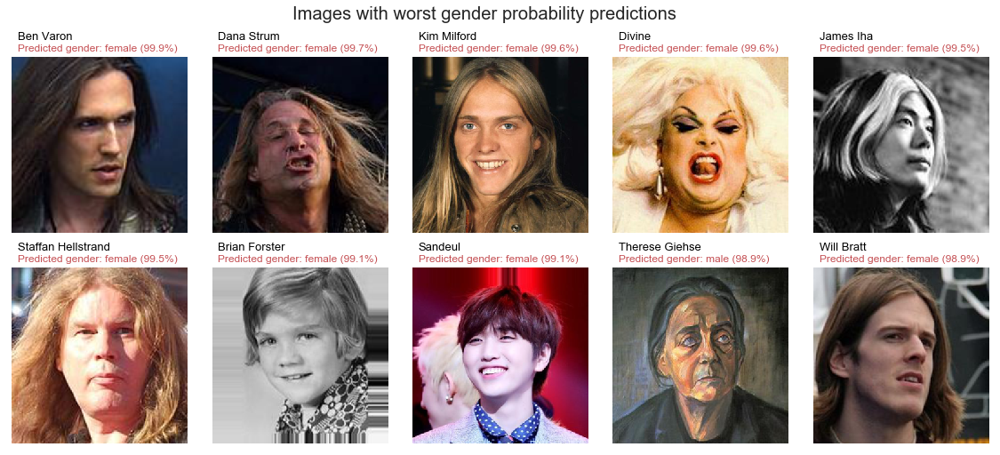

In [16]:
# Displaying the images with the worst correct gender probability
display_worst_probability(wiki_metadata, feature = "gender", path_data = "./data/verified_gender/", rows = 2)

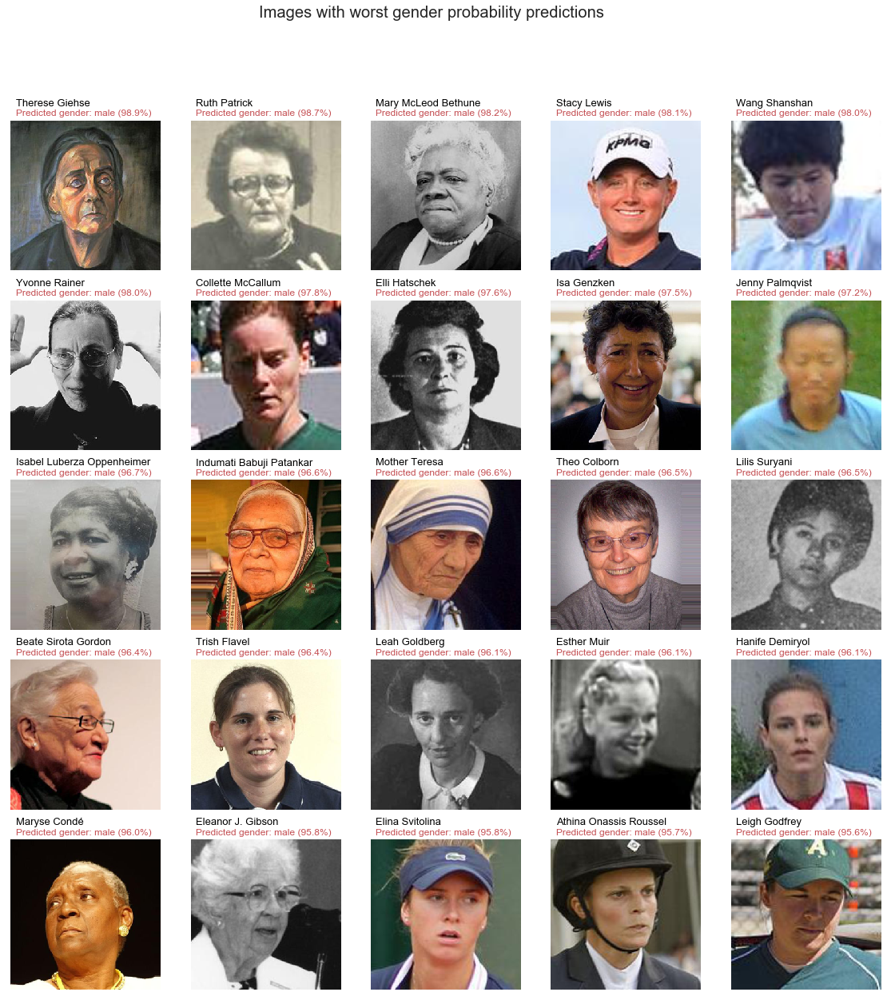

In [17]:
# Displaying the images with the worst correct gender probability for females
display_worst_probability(wiki_metadata[wiki_metadata["gender"] == "female"], feature = "gender", path_data = "./data/verified_gender/", rows = 5)

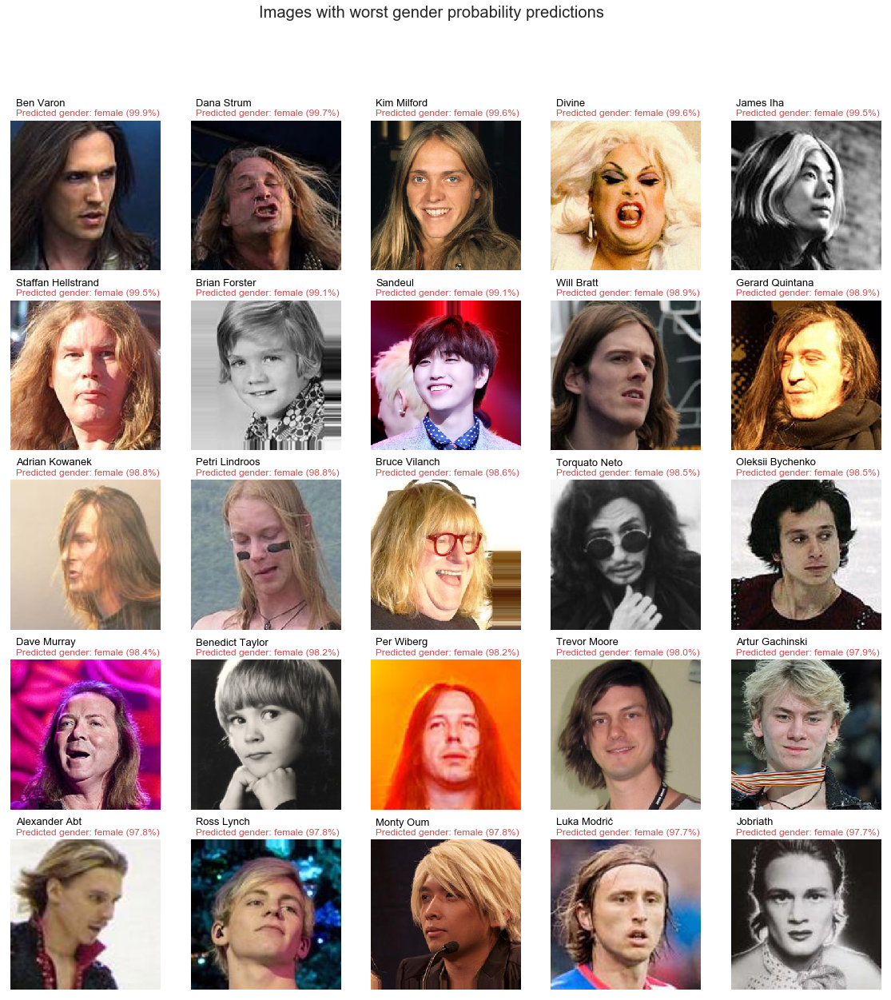

In [18]:
# Displaying the images with the worst correct gender probability for males
display_worst_probability(wiki_metadata[wiki_metadata["gender"] == "male"], feature = "gender", path_data = "./data/verified_gender/", rows = 5)

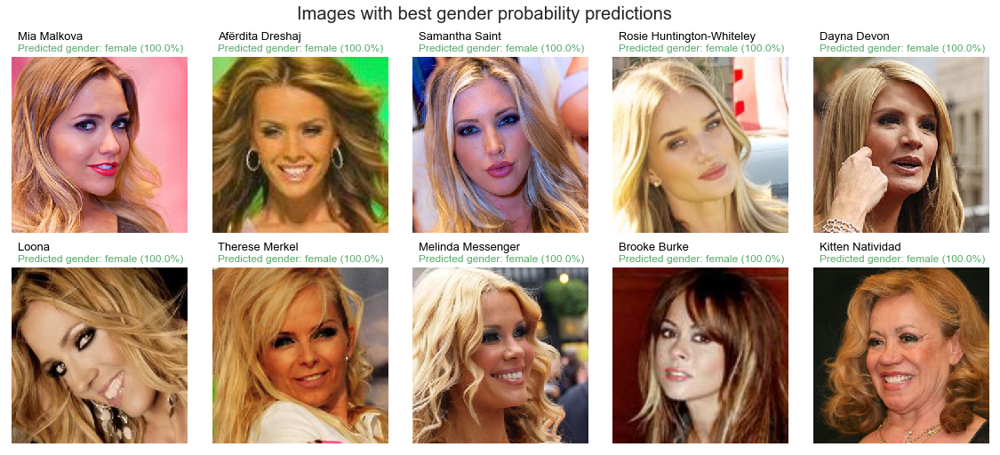

In [19]:
# Displaying the images with the best correct gender probability
display_worst_probability(wiki_metadata, feature = "gender", path_data = "./data/verified_gender/", rows = 2, best = True)

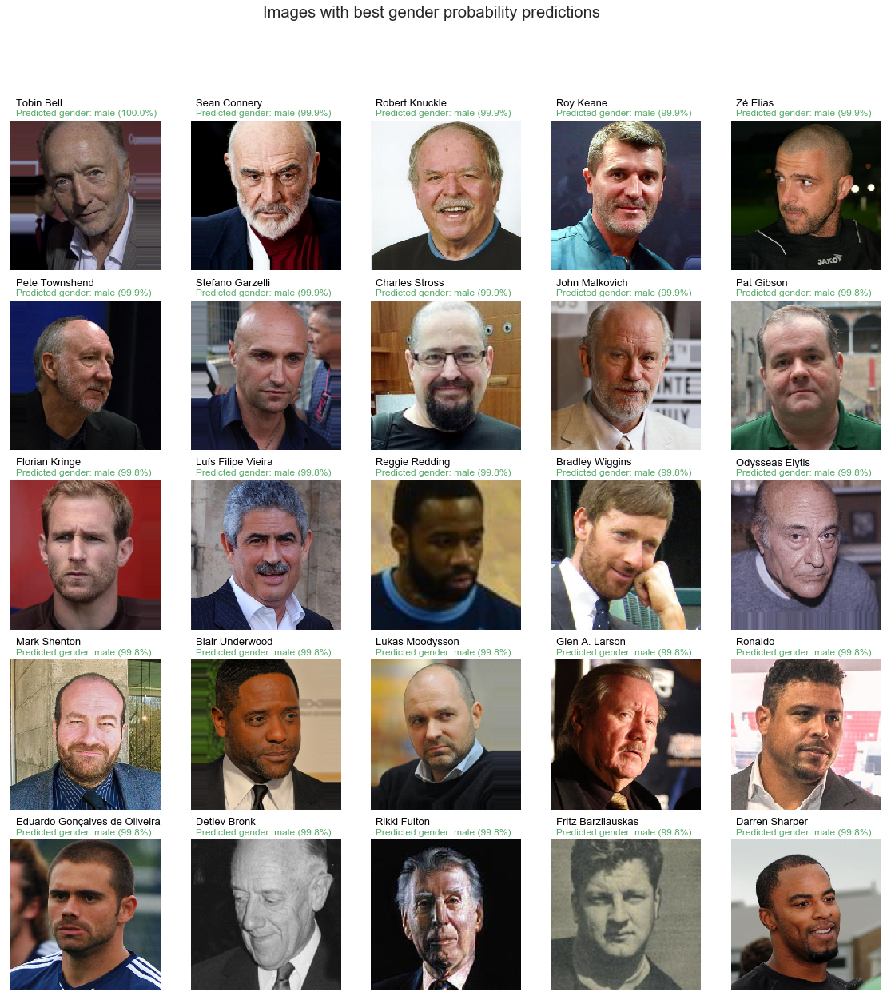

In [20]:
# Displaying the images with the best correct gender probability for males
display_worst_probability(wiki_metadata[wiki_metadata["gender"] == "male"], feature = "gender", path_data = "./data/verified_gender/", rows = 5, best = True)

In [21]:
# Defining lists of male and female images
list_images_male = wiki_metadata[wiki_metadata["gender"] == "male"]["new_path_gender"]
list_images_female = wiki_metadata[wiki_metadata["gender"] == "female"]["new_path_gender"]

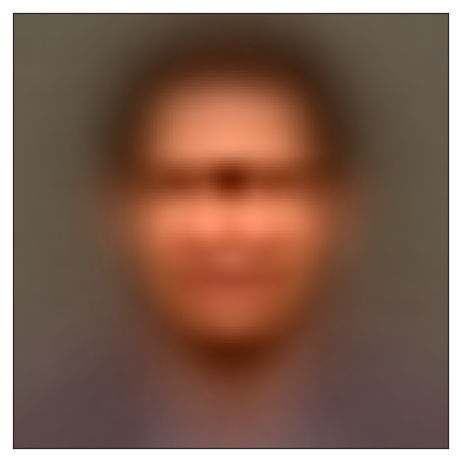

In [22]:
# Displaying the average image of a male
display_average_image(list_images_male)

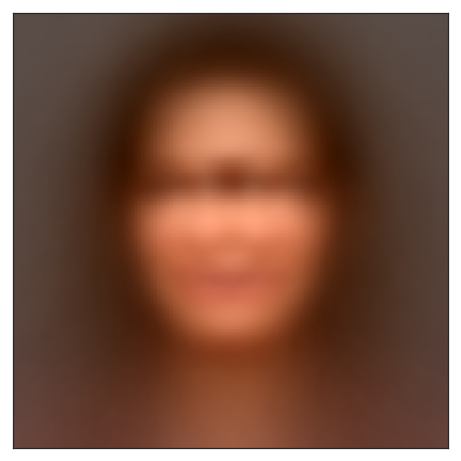

In [23]:
# Displaying the average image of a female
display_average_image(list_images_female)

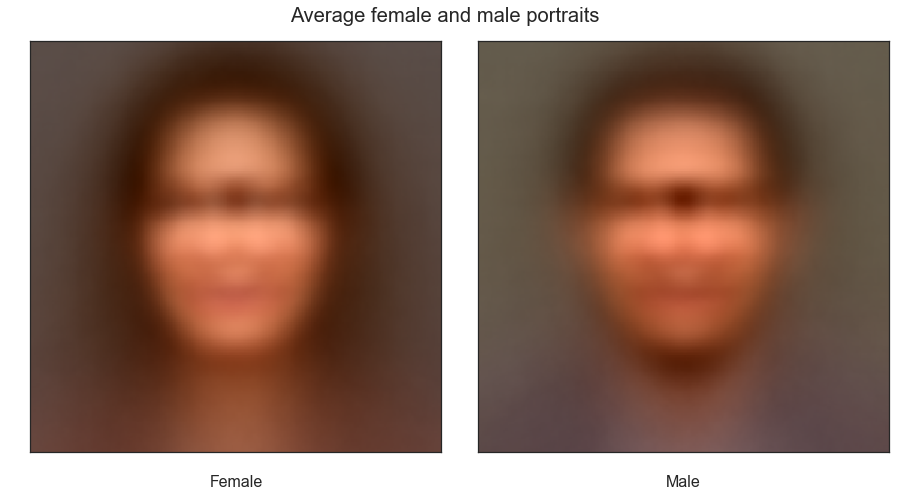

In [24]:
# Average female and male portraits
fig = plt.figure(figsize = (16, 8))
plt.xticks([0.25, 0.75], ["Female", "Male"], size = 16)
plt.yticks([])
sns.despine(bottom = True, left = True)

ax1 = fig.add_subplot(1, 2, 1)
im = PIL.Image.open("./images/average_female.png")
ax1.imshow(im)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
im = PIL.Image.open("./images/average_male.png")
ax2.imshow(im)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.axis("off")

plt.suptitle("Average female and male portraits", y = 0.92)
plt.subplots_adjust(wspace = 0.01, hspace = 0.01)

plt.show()

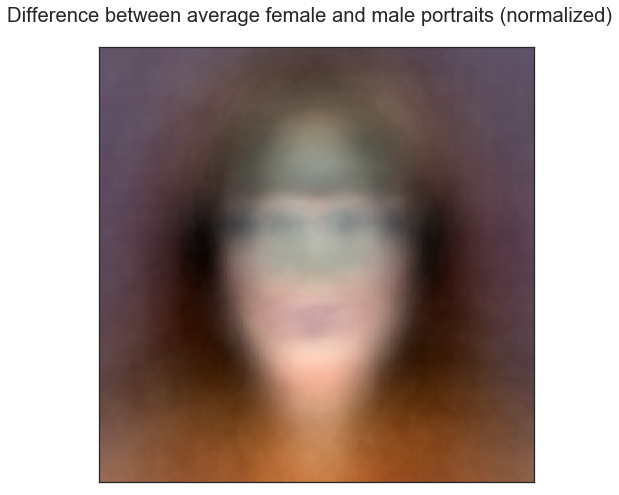

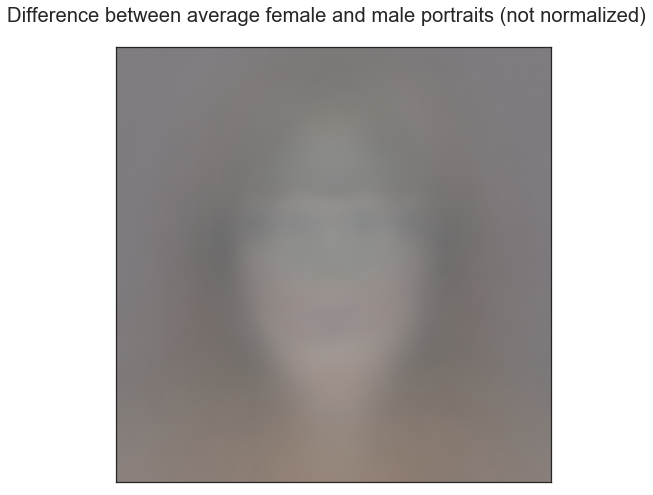

In [25]:
# Displaying the average difference between a female and a male, with and without renormalization
display_difference_average_image(list_images_female, list_images_male, renormalize=True, title = "Difference between average female and male portraits (normalized)")
display_difference_average_image(list_images_female, list_images_male, renormalize=False, title = "Difference between average female and male portraits (not normalized)")

In [26]:
# Defining lists of images for comparison purpose (male and female true positives and false negatives)
list_male_ok = wiki_metadata[(wiki_metadata["correct_gender_probability"] > 0.5) &  (wiki_metadata["gender"] == "male")]["new_path_gender"]
list_male_notok = wiki_metadata[(wiki_metadata["correct_gender_probability"] < 0.5) &  (wiki_metadata["gender"] == "male")]["new_path_gender"]
list_female_ok = wiki_metadata[(wiki_metadata["correct_gender_probability"] > 0.5) &  (wiki_metadata["gender"] == "female")]["new_path_gender"]
list_female_notok = wiki_metadata[(wiki_metadata["correct_gender_probability"] < 0.5) &  (wiki_metadata["gender"] == "female")]["new_path_gender"]

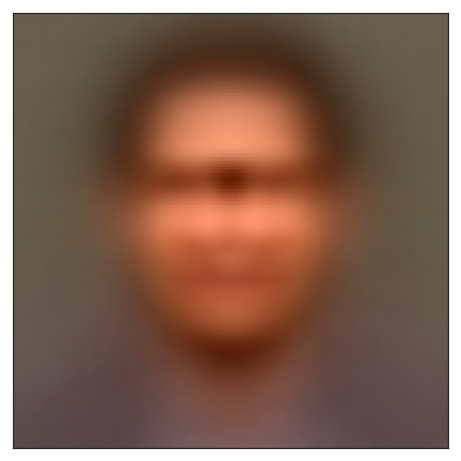

In [27]:
# Displaying the average image of a male, with correct prediction by the model
display_average_image(list_male_ok)

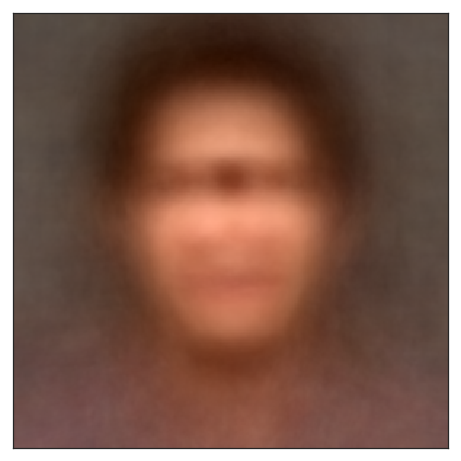

In [28]:
# Displaying the average image of a male, with incorrect prediction by the model
display_average_image(list_male_notok)

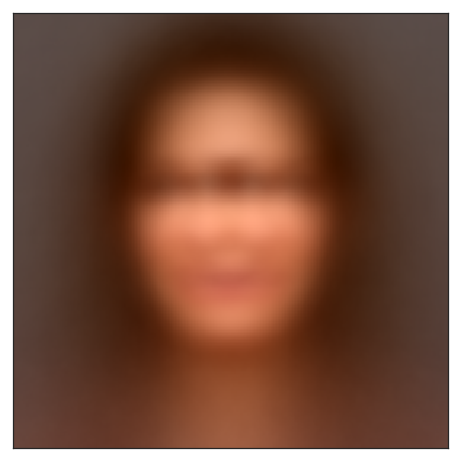

In [29]:
# Displaying the average image of a female, with correct prediction by the model
display_average_image(list_female_ok)

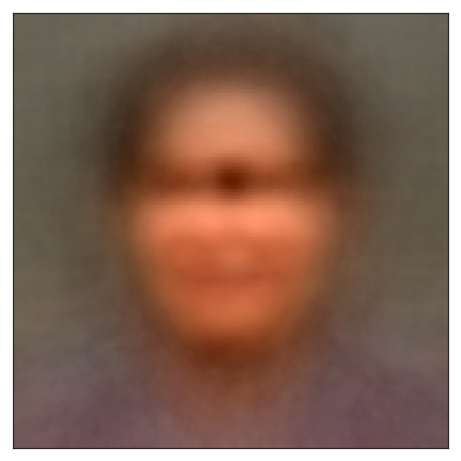

In [30]:
# Displaying the average image of a female, with incorrect prediction by the model
display_average_image(list_female_notok)

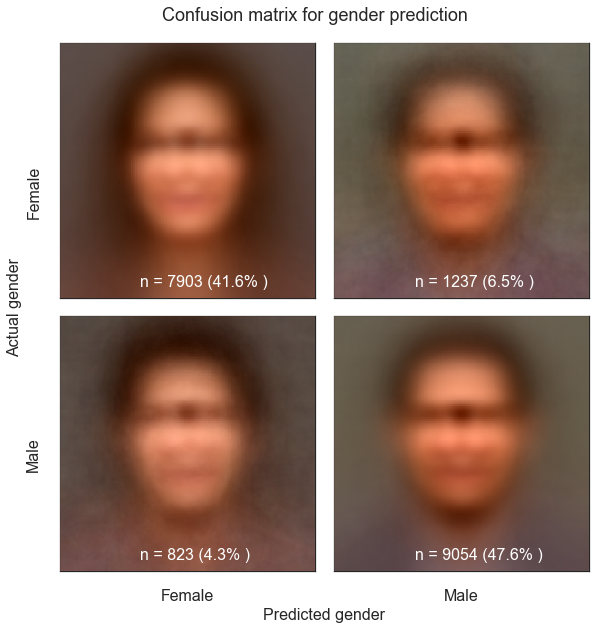

In [31]:
# Confusion matrix with average portrait for each catagory (male / female & correctly labelled / mislabelled)
fig = plt.figure(figsize = (9.8, 10))
plt.xlabel("Predicted gender", size = 16)
plt.ylabel("Actual gender", size = 16)
plt.xticks([0.25, 0.75], ["Female", "Male"], size = 16)
plt.yticks([0.25, 0.75], ["Male", "Female"], rotation = 90, size = 16)
sns.despine(bottom = True, left = True)

ax1 = fig.add_subplot(2, 2, 1)
im = PIL.Image.open("./images/correct_female.png")
ax1.imshow(im)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.axis("off")
ax1.text(150, 420, "n = " + str(len(list_female_ok)) + " (" + str(round(len(list_female_ok)/len(wiki_metadata)*100,1)) + "% )", verticalalignment = "center", horizontalalignment = "left", color = "white", size = 16)

ax2 = fig.add_subplot(2, 2, 2)
im = PIL.Image.open("./images/incorrect_female.png")
ax2.imshow(im)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.axis("off")
ax2.text(150, 420, "n = " + str(len(list_female_notok)) + " (" + str(round(len(list_female_notok)/len(wiki_metadata)*100,1)) + "% )", verticalalignment = "center", horizontalalignment = "left", color = "white", size = 16)

ax3 = fig.add_subplot(2, 2, 3)
im = PIL.Image.open("./images/incorrect_male.png")
ax3.imshow(im)
ax3.set_xticks([])
ax3.set_yticks([])
ax3.axis("off")
ax3.text(150, 420, "n = " + str(len(list_male_notok)) + " (" + str(round(len(list_male_notok)/len(wiki_metadata)*100,1)) + "% )", verticalalignment = "center", horizontalalignment = "left", color = "white", size = 16)

ax4 = fig.add_subplot(2, 2, 4)
im = PIL.Image.open("./images/correct_male.png")
ax4.imshow(im)
ax4.set_xticks([])
ax4.set_yticks([])
ax4.axis("off")
ax4.text(150, 420, "n = " + str(len(list_male_ok)) + " (" + str(round(len(list_male_ok)/len(wiki_metadata)*100,1)) + "% )", verticalalignment = "center", horizontalalignment = "left", color = "white", size = 16)


plt.suptitle("Confusion matrix for gender prediction", y = 0.92, size = 18)
plt.subplots_adjust(wspace = 0.01, hspace = 0.01)

plt.show()

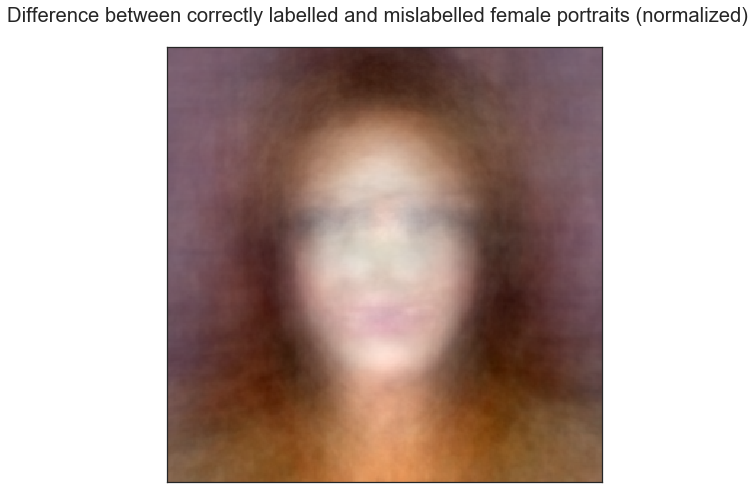

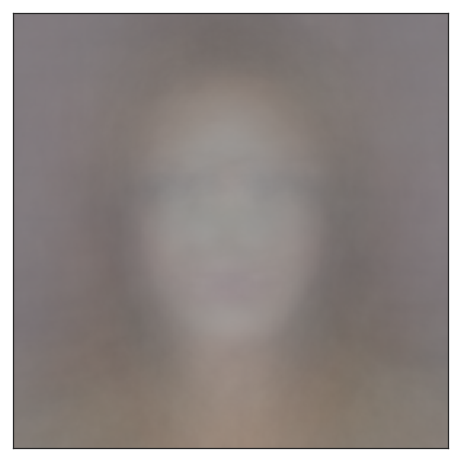

In [32]:
# Displaying the average difference between images of females that have been correctly and incorrectly labeled by the model
display_difference_average_image(list_female_ok, list_female_notok, renormalize=True, title = "Difference between correctly labelled and mislabelled female portraits (normalized)")
display_difference_average_image(list_female_ok, list_female_notok, renormalize=False)

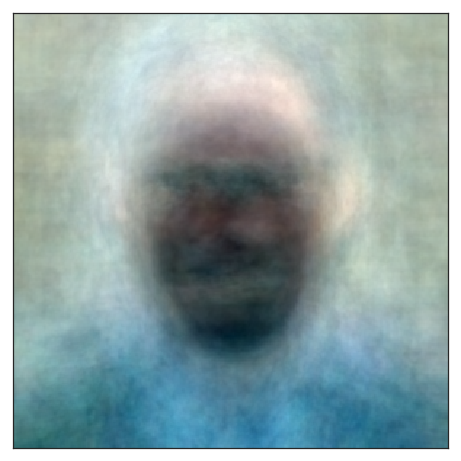

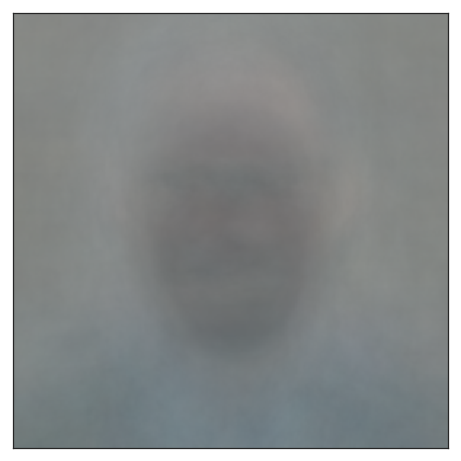

In [33]:
# Displaying the average difference between images of males that have been correctly and incorrectly labeled by the model
display_difference_average_image(list_male_ok, list_male_notok, renormalize=True)
display_difference_average_image(list_male_ok, list_male_notok, renormalize=False)

# Retraining inception model with other machine learning models

Instead of retraining the last layer of the inception neural network model using Tensorflow, it is possible to use bottlenecks data generated by Tensorflow as features for faster and more complex models.

In particular, the lightGBM algorithm is used to train on bottlenecks data and predict the gender and age of the portrait. This model is selected because of its speed and perfromance. In practice, it can perform cross-validation prediction in a few minutes, instead of several hours for the Tensorflow model.

In [34]:
# Reading bottlenecks data into a new dataframe
bottlenecks = read_bottlenecks(wiki_metadata, path_bottlenecks = "./bottlenecks/", feature1 = "gender", feature2 = "age")
bottlenecks.columns = bottlenecks.columns.astype(str)

C:\Anaconda3\lib\site-packages\pandas\core\frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


Progress: 100%   


In [35]:
# Merging the two dataframes together
wiki_metadata = wiki_metadata.merge(bottlenecks, on= "new_file_name")

In [36]:
# Creating dummy variables for gender (gender_male and gender_female) to allow training by the LightGBM model
dummies = pd.get_dummies(wiki_metadata["gender"])
wiki_metadata = pd.concat([wiki_metadata, dummies], axis = 1)

In [37]:
# Creating filtered dataframe to ensure uniform age distribution
wiki_metadata_filtered = stratify_age_data(wiki_metadata, ranges_age = [10, 20, 30, 40, 50, 60, 70, 100], sample_size = 1000)

In [38]:
# Definition of features for training and predictions (bottlenecks)
features = [str(x) for x in range(1,2049)]

In [39]:
#Default LightGBM parameters
estimator_param = {}
estimator_param["boosting_type"]="gbdt"
estimator_param["num_leaves"]=1000
estimator_param["max_depth"]=5
estimator_param["learning_rate"]=0.1
estimator_param["n_estimators"]=50000
estimator_param["subsample_for_bin"]=200000
estimator_param["objective"]="binary"
estimator_param["class_weight"]=None
estimator_param["min_split_gain"]=0.5
estimator_param["min_child_weight"]=0.001
estimator_param["min_child_samples"]=40
estimator_param["subsample"]=0.8
estimator_param["subsample_freq"]=0
estimator_param["bagging_freq"]=1
estimator_param["colsample_bytree"]=0.2
estimator_param["reg_alpha"]=20.0
estimator_param["reg_lambda"]=0.0
estimator_param["random_state"]=2
estimator_param["n_jobs"]=7
estimator_param["silent"]=True
estimator_param["importance_type"]="split"

In [40]:
# Optimized hyperparameters obtained using Grid Search
param_grid_gender = {}
param_grid_gender["max_depth"] = [4]
param_grid_gender["min_child_samples"] = [90]
param_grid_gender["subsample"] = [0.4]
param_grid_gender["subsample_freq"]=[1.0]
param_grid_gender["colsample_bytree"]=[1.0]
param_grid_gender["reg_alpha"] = [2]
param_grid_gender["reg_lambda"] = [125]
param_grid_gender["learning_rate"] = [0.1]
param_grid_gender["random_state"]=[2]
param_grid_gender["n_estimators"]=[10000]


Hyperparameters:
max_depth : 4
min_child_samples : 90
subsample : 0.4
subsample_freq : 1.0
colsample_bytree : 1.0
reg_alpha : 2
reg_lambda : 125
learning_rate : 0.1
random_state : 2
n_estimators : 10000
CV 1 : Accuracy: 0.903 (n_trees: 423)
CV 2 : Accuracy: 0.903 (n_trees: 455)
CV 3 : Accuracy: 0.899 (n_trees: 384)
CV 4 : Accuracy: 0.907 (n_trees: 542)
CV 5 : Accuracy: 0.906 (n_trees: 219)
Cross-Validation Accuracy: 0.9035 +/- 0.0061 (n_trees: 405)


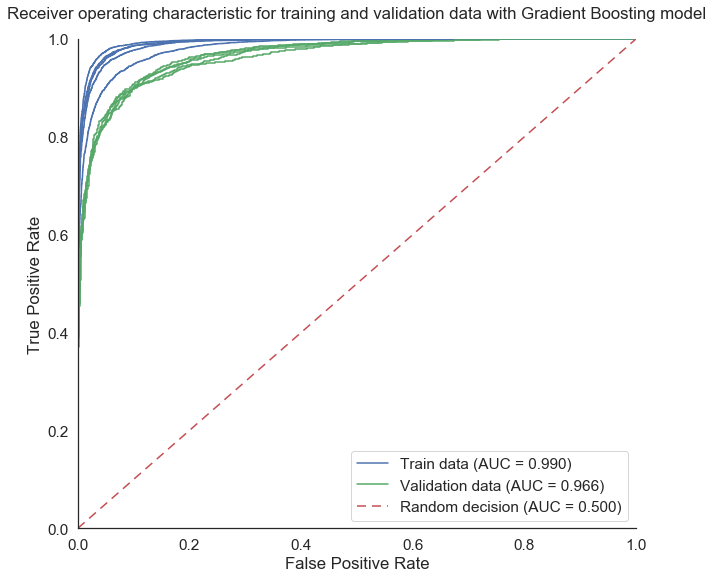

In [41]:
# Cross validation prediction with optimized hyperparameters
predictions_gender = GridSearch_lgb_classifier(wiki_metadata[features], wiki_metadata["female"], param_grid_gender, cv = 5, predict = True)

In [42]:
wiki_metadata["female_probability_lgbm"] = predictions_gender
wiki_metadata["correct_gender_probability_lgbm"] = 0.0
wiki_metadata.loc[wiki_metadata["gender"] == "female", "correct_gender_probability_lgbm"] = wiki_metadata["female_probability_lgbm"]
wiki_metadata.loc[wiki_metadata["gender"] == "male", "correct_gender_probability_lgbm"] = 1 - wiki_metadata["female_probability_lgbm"]

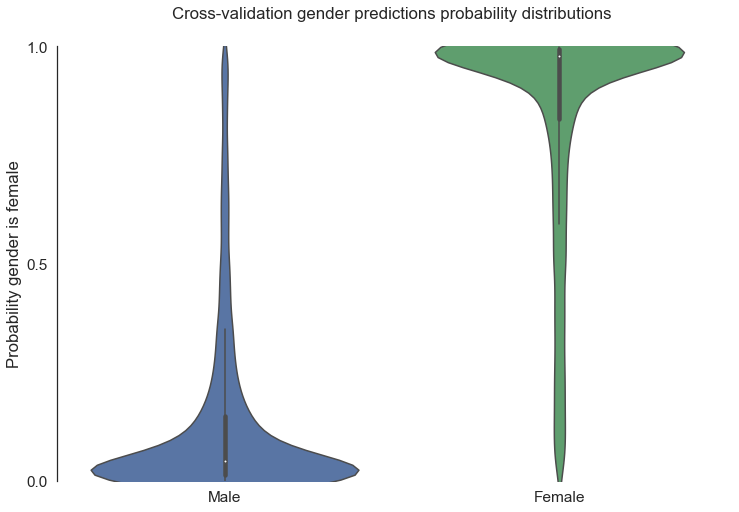

In [43]:
# Plotting CV prediction probability distribution for gender
fig, ax = plt.subplots(figsize=(12,8))
sns.violinplot(x = "gender", y = "female_probability_lgbm", data = wiki_metadata, 
               orient = "v", palette=pal, ax = ax)
ax.set_xlabel("")
ax.set_ylabel("Probability gender is female")
ax.set_xticklabels(["Male", "Female"])
ax.set_yticks([0.0, 0.5, 1.0])
plt.ylim(0, 1)
ax.set_title("Cross-validation gender predictions probability distributions", y = 1.05)
sns.despine(bottom = True)
plt.show()

# Application to age prediction

The same bottlenecks can also be used to create a regression model (in this case lightGBM regressor) to predict the age in the portrait.

In [44]:
# Optimized hyperparameters obtained using Grid Search
param_grid_age = {}
param_grid_age["max_depth"] = [4]
param_grid_age["min_child_samples"] = [20]
param_grid_age["subsample"] = [1.0]
param_grid_age["subsample_freq"]=[1]
param_grid_age["colsample_bytree"]=[1.0]
param_grid_age["reg_alpha"] = [150]
param_grid_age["reg_lambda"] = [1000]
param_grid_age["learning_rate"] = [0.05]
param_grid_age["random_state"]=[2]
param_grid_age["objective"]=["regression"]
param_grid_age["n_estimators"]=[100000]


Hyperparameters:
max_depth : 4
min_child_samples : 20
subsample : 1.0
subsample_freq : 1
colsample_bytree : 1.0
reg_alpha : 150
reg_lambda : 1000
learning_rate : 0.05
random_state : 2
objective : regression
n_estimators : 100000
CV fold #1 (n_trees: 2339)
Root Mean Squared Error for training data: 5.799 / validation data: 11.470
Mean Absolute Error for training data: 4.454 / validation data: 8.772
Spearman's rank correlation coefficient for training data: 0.919 / validation data: 0.649


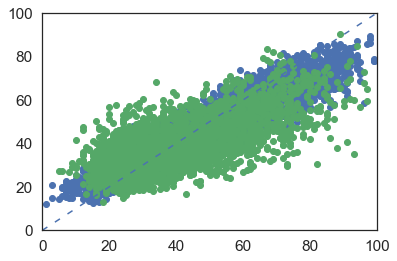

CV fold #2 (n_trees: 1644)
Root Mean Squared Error for training data: 6.945 / validation data: 11.513
Mean Absolute Error for training data: 5.335 / validation data: 8.731
Spearman's rank correlation coefficient for training data: 0.883 / validation data: 0.641


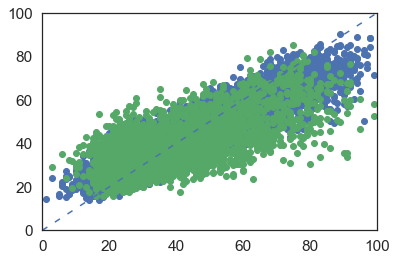

CV fold #3 (n_trees: 2192)
Root Mean Squared Error for training data: 6.031 / validation data: 11.320
Mean Absolute Error for training data: 4.648 / validation data: 8.681
Spearman's rank correlation coefficient for training data: 0.912 / validation data: 0.653


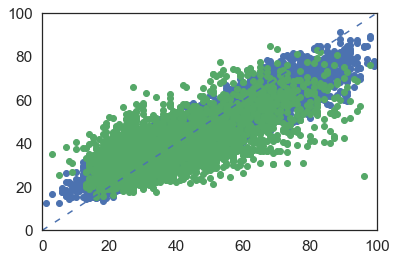

CV fold #4 (n_trees: 1976)
Root Mean Squared Error for training data: 6.346 / validation data: 11.525
Mean Absolute Error for training data: 4.866 / validation data: 8.798
Spearman's rank correlation coefficient for training data: 0.901 / validation data: 0.652


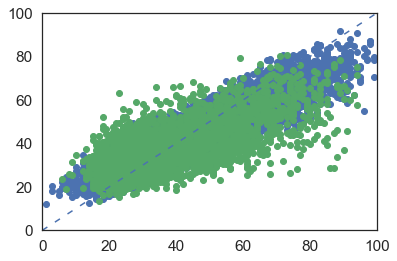

CV fold #5 (n_trees: 2638)
Root Mean Squared Error for training data: 5.366 / validation data: 11.738
Mean Absolute Error for training data: 4.129 / validation data: 8.971
Spearman's rank correlation coefficient for training data: 0.930 / validation data: 0.641


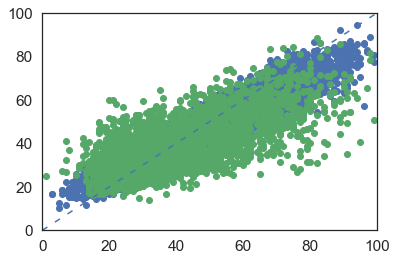

Cross-Validation resuls: (average n_trees: 2158)
Root Mean Squared Error for training data: 6.097 +/- 0.531/ validation data: 11.513 +/- 0.134
Mean Absolute Error for training data: 4.687 +/- 0.405/ validation data: 8.791 +/- 0.098
Spearman's rank correlation coefficient for training data: 0.909 / validation data: 0.647



In [45]:
# Cross validation prediction with optimized hyperparameters
predictions_age = GridSearch_lgb_regressor(wiki_metadata[features], wiki_metadata["age"], param_grid_age, cv = 5, predict = True)

In [46]:
wiki_metadata["predicted_age_lgbm"] = predictions_age
wiki_metadata["error_age"] = wiki_metadata["predicted_age_lgbm"] - wiki_metadata["age"]
wiki_metadata["absolute_error_age"] = abs(wiki_metadata["error_age"])

In [47]:
# Defining optimum number of trees
param_grid_age["n_estimators"]=2400

# Predictions for training data
lgb = LGBMRegressor(max_depth=param_grid_age["max_depth"],
                    learning_rate=param_grid_age["learning_rate"],
                    n_estimators=param_grid_age["n_estimators"], 
                    objective=param_grid_age["objective"],
                    min_child_samples=param_grid_age["min_child_samples"],
                    subsample=param_grid_age["subsample"],
                    subsample_freq=param_grid_age["subsample_freq"],
                    colsample_bytree=param_grid_age["colsample_bytree"],
                    reg_alpha=param_grid_age["reg_alpha"],
                    reg_lambda=param_grid_age["reg_lambda"],
                    random_state=param_grid_age["random_state"],
                    n_jobs=7,
                    )

lgb.fit(wiki_metadata[features], wiki_metadata["age"])
predictions_age_train = lgb.predict(wiki_metadata[features])

In [48]:
wiki_metadata["predicted_age_lgbm_train"] = predictions_age_train

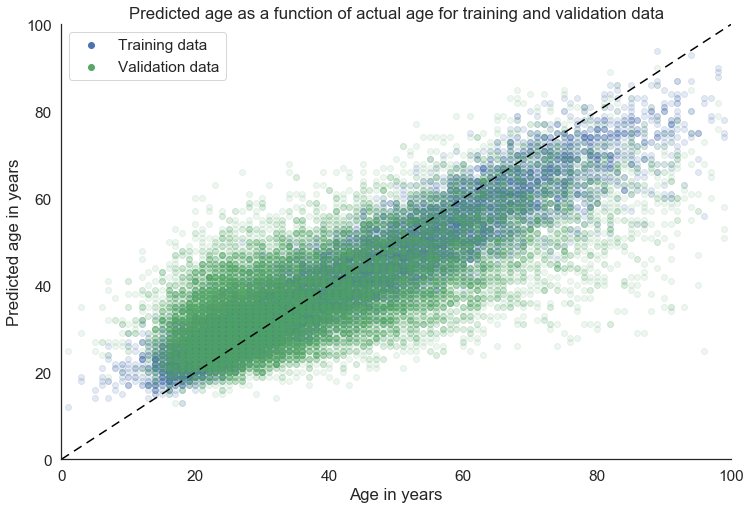

In [49]:
# Plotting the predicted age as a function of actual age
fig = plt.figure(figsize = (12, 8))
plt.scatter(wiki_metadata["age"], np.round(wiki_metadata["predicted_age_lgbm_train"]), alpha = 0.15, label = "Training data")
plt.scatter(wiki_metadata["age"], np.round(wiki_metadata["predicted_age_lgbm"]), alpha = 0.1, label = "Validation data")
plt.plot([0,100], [0,100], color = "black", dashes = (6,4))
plt.xlim(0,100)
plt.ylim(0,100)
sns.despine()
plt.xlabel("Age in years")
plt.ylabel("Predicted age in years")
plt.title("Predicted age as a function of actual age for training and validation data")
legend = plt.legend()
for lh in legend.legendHandles: 
    lh.set_alpha(1)
plt.show()

Hyperparameters:
max_depth : 4
min_child_samples : 20
subsample : 1.0
subsample_freq : 1
colsample_bytree : 1.0
reg_alpha : 150
reg_lambda : 1000
learning_rate : 0.05
random_state : 2
objective : regression
n_estimators : 2400
CV fold #1 (n_trees: 2400)
Root Mean Squared Error for training data: 8.845 / validation data: 16.656
Mean Absolute Error for training data: 7.097 / validation data: 13.339
Spearman's rank correlation coefficient for training data: 0.930 / validation data: 0.014


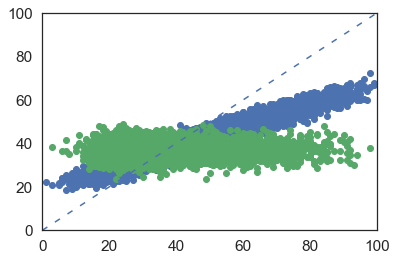

CV fold #2 (n_trees: 2400)
Root Mean Squared Error for training data: 8.778 / validation data: 16.735
Mean Absolute Error for training data: 7.042 / validation data: 13.456
Spearman's rank correlation coefficient for training data: 0.929 / validation data: -0.027


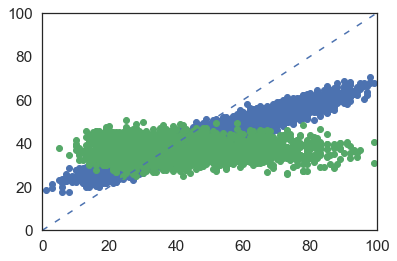

CV fold #3 (n_trees: 2400)
Root Mean Squared Error for training data: 8.814 / validation data: 16.772
Mean Absolute Error for training data: 7.063 / validation data: 13.433
Spearman's rank correlation coefficient for training data: 0.930 / validation data: -0.013


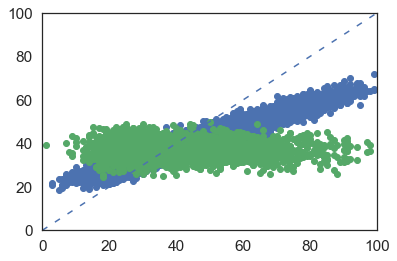

CV fold #4 (n_trees: 2400)
Root Mean Squared Error for training data: 8.814 / validation data: 16.773
Mean Absolute Error for training data: 7.067 / validation data: 13.533
Spearman's rank correlation coefficient for training data: 0.931 / validation data: -0.005


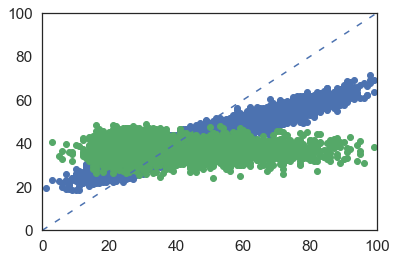

CV fold #5 (n_trees: 2400)
Root Mean Squared Error for training data: 8.774 / validation data: 17.043
Mean Absolute Error for training data: 7.007 / validation data: 13.800
Spearman's rank correlation coefficient for training data: 0.929 / validation data: -0.008


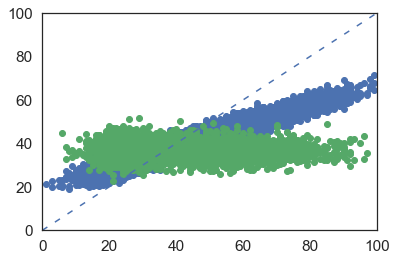

Cross-Validation resuls: (average n_trees: 2400)
Root Mean Squared Error for training data: 8.805 +/- 0.026/ validation data: 16.796 +/- 0.131
Mean Absolute Error for training data: 7.055 +/- 0.030/ validation data: 13.512 +/- 0.157
Spearman's rank correlation coefficient for training data: 0.930 / validation data: -0.008



In [50]:
# Cross-validation prediction for random age label
param_grid_age["n_estimators"]=[2400]
randomized_age = wiki_metadata["age"].sample(frac=1).reset_index(drop=True)
predictions_age_random = GridSearch_lgb_regressor(wiki_metadata[features], 
                                                  randomized_age, 
                                                  param_grid_age, cv = 5, predict = True, early_stopping = False)

In [51]:
# Predictions for training data with random age
lgb.fit(wiki_metadata[features], randomized_age)
predictions_age_train_random = lgb.predict(wiki_metadata[features])

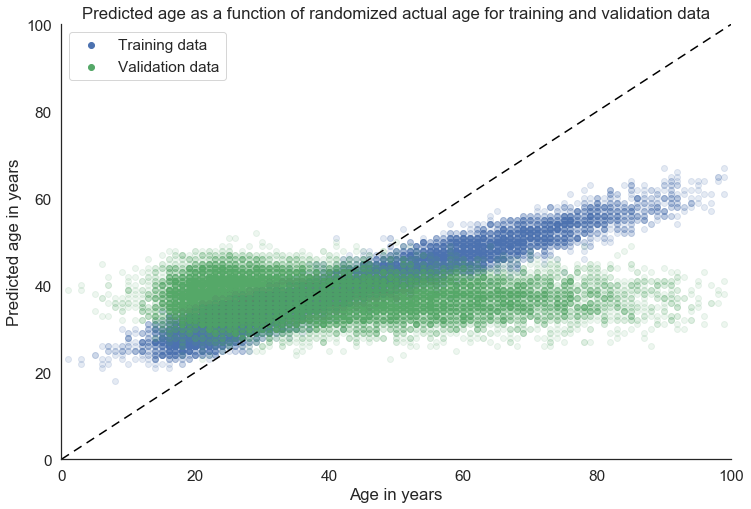

In [52]:
# Plotting the predicted age as a function of actual age
fig = plt.figure(figsize = (12, 8))
plt.scatter(randomized_age, np.round(predictions_age_train_random), alpha = 0.15, label = "Training data")
plt.scatter(randomized_age, np.round(predictions_age_random["predict_proba"]), alpha = 0.1, label = "Validation data")
plt.plot([0,100], [0,100], color = "black", dashes = (6,4))
plt.xlim(0,100)
plt.ylim(0,100)
sns.despine()
plt.xlabel("Age in years")
plt.ylabel("Predicted age in years")
plt.title("Predicted age as a function of randomized actual age for training and validation data")
legend = plt.legend()
for lh in legend.legendHandles: 
    lh.set_alpha(1)
plt.show()

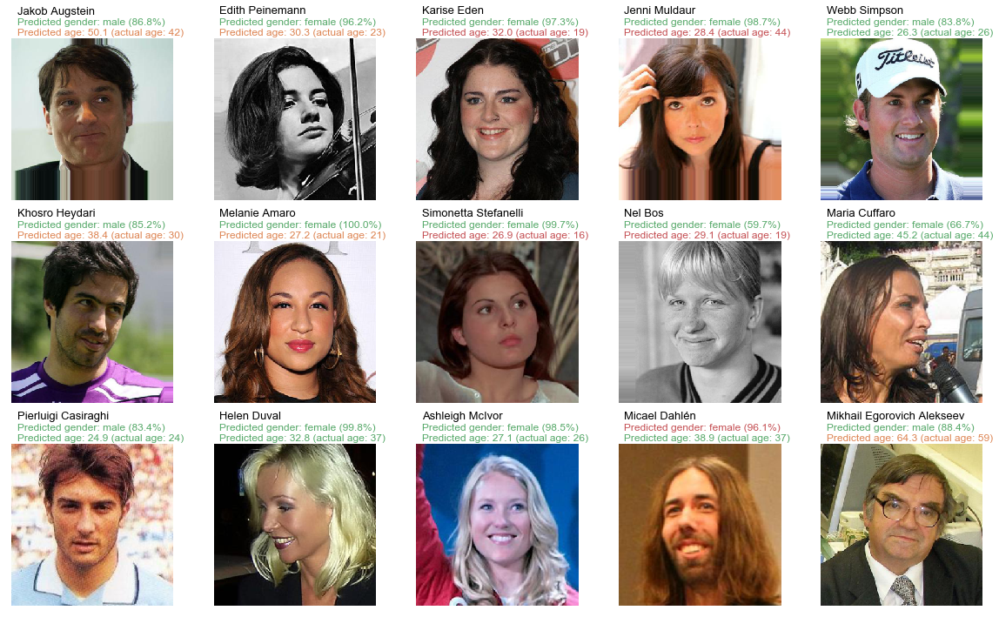

In [53]:
display_predictions_sample(wiki_metadata, path_data="./data/verified_gender/", rows = 3, random_state = 2)

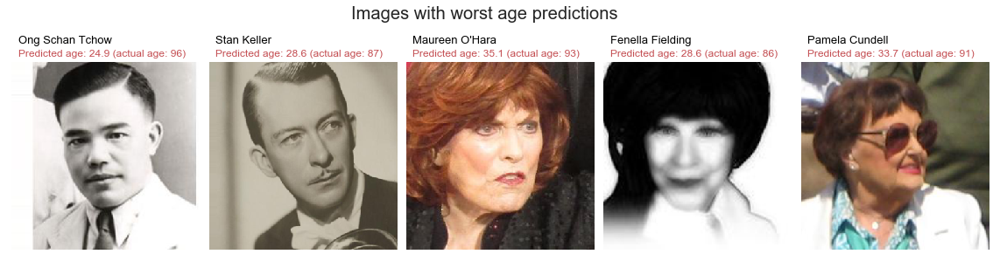

In [54]:
display_worst_age_predictions(wiki_metadata, path_data="./data/verified_gender/", rows=1, best = False)

In [55]:
list_age_young_adult = wiki_metadata[(wiki_metadata["predicted_age_lgbm"] >= 20) & (wiki_metadata["predicted_age_lgbm"] < 40)]["new_path_gender"]
list_age_middle_age = wiki_metadata[(wiki_metadata["predicted_age_lgbm"] >= 40) & (wiki_metadata["predicted_age_lgbm"] < 65)]["new_path_gender"]
list_age_senior = wiki_metadata[wiki_metadata["predicted_age_lgbm"] >= 65]["new_path_gender"]


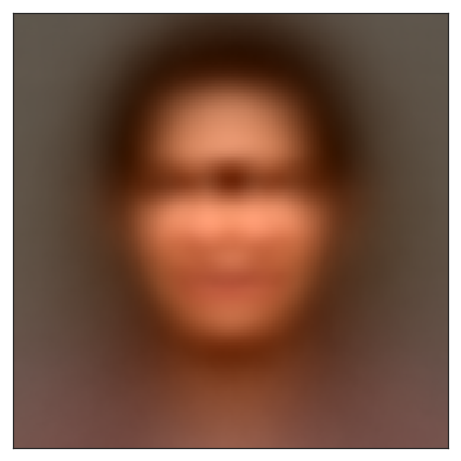

In [56]:
display_average_image(list_age_young_adult)

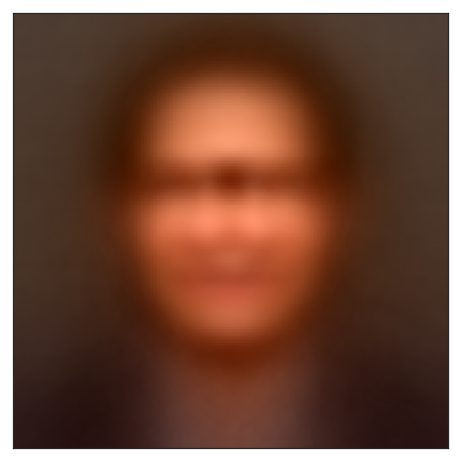

In [57]:
display_average_image(list_age_middle_age)

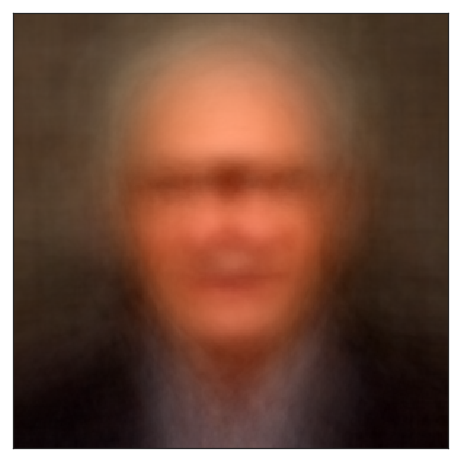

In [58]:
display_average_image(list_age_senior)

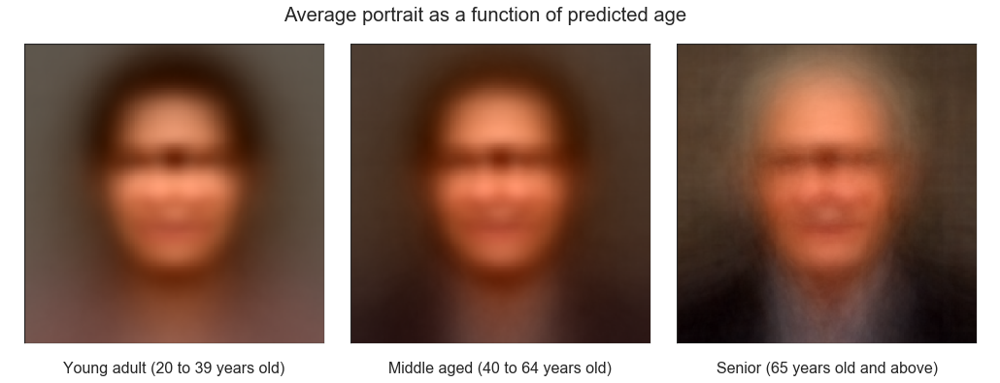

In [59]:
# Average female and male portraits
fig = plt.figure(figsize = (18, 6))
plt.xticks([0.33/2, 0.5, 1-0.33/2], ["Young adult (20 to 39 years old)", "Middle aged (40 to 64 years old)", "Senior (65 years old and above)"], size = 16)
plt.yticks([])
sns.despine(bottom = True, left = True)

ax1 = fig.add_subplot(1, 3, 1)
im = PIL.Image.open("./images/average_young_adult.png")
ax1.imshow(im)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.axis("off")

ax2 = fig.add_subplot(1, 3, 2)
im = PIL.Image.open("./images/average_middle_age.png")
ax2.imshow(im)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.axis("off")

ax2 = fig.add_subplot(1, 3, 3)
im = PIL.Image.open("./images/average_senior.png")
ax2.imshow(im)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.axis("off")

plt.suptitle("Average portrait as a function of predicted age", y = 0.95)
plt.subplots_adjust(wspace = 0.01, hspace = 0.01)

plt.show()

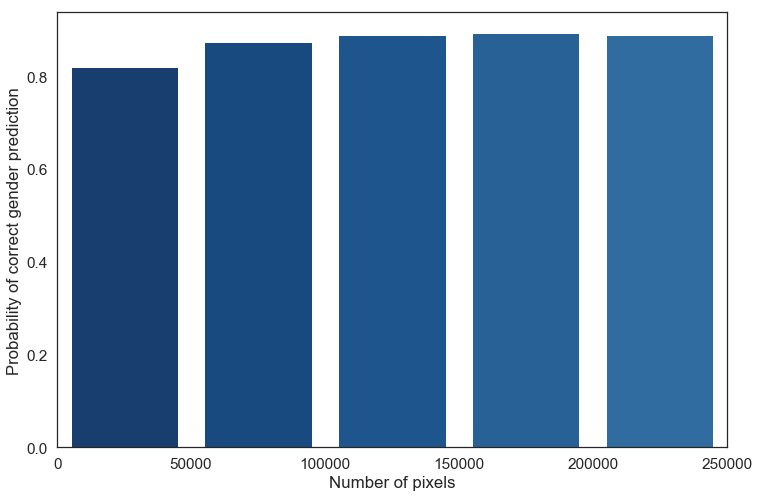

In [60]:
fig = plt.figure(figsize=(12,8))
bins = pd.cut(wiki_metadata["number_pixels"], 5)
df2 = wiki_metadata.pivot_table("correct_gender_probability_lgbm", bins, aggfunc='mean').reset_index()
ax = sns.barplot(x="number_pixels", y="correct_gender_probability_lgbm", orient = "v", data = df2, palette = sns.color_palette("Blues_r" ,20))
plt.xticks([-0.5, 0.5, 1.5, 2.5, 3.5, 4.5], [0, 50000, 100000, 150000, 200000, 250000])
plt.xlabel("Number of pixels")
plt.ylabel("Probability of correct gender prediction")
plt.show()

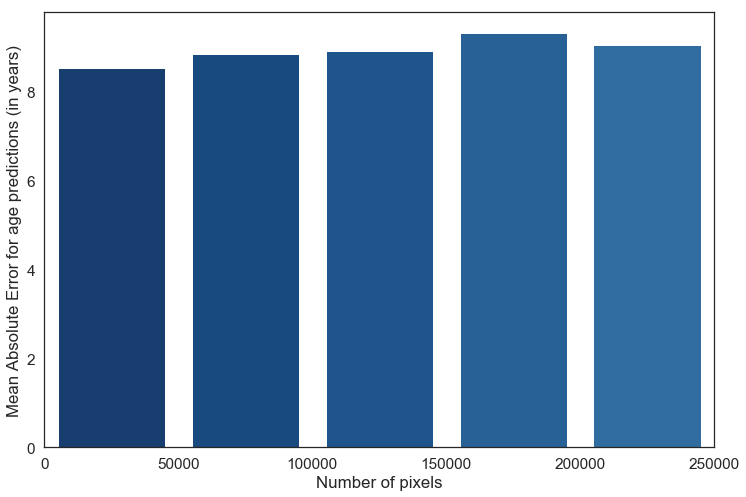

In [61]:
fig = plt.figure(figsize=(12,8))
bins = pd.cut(wiki_metadata["number_pixels"], 5)
df2 = wiki_metadata.pivot_table("absolute_error_age", bins, aggfunc='mean').reset_index()
ax = sns.barplot(x="number_pixels", y="absolute_error_age", orient = "v", data = df2, palette = sns.color_palette("Blues_r" ,20))
plt.xticks([-0.5, 0.5, 1.5, 2.5, 3.5, 4.5], [0, 50000, 100000, 150000, 200000, 250000])
plt.xlabel("Number of pixels")
plt.ylabel("Mean Absolute Error for age predictions (in years)")
plt.show()

In [62]:
wiki_metadata_predictions_tf = wiki_metadata[["new_file_name", "correct_gender_probability", "probability_gender_female", "probability_gender_male"]]

In [63]:
wiki_metadata_predictions_tf.to_csv("./data/wiki_metadata_predictions_tf.csv", index = False)